# Generative Models (160 + 40 points)

## Diffusion Models vs. GANs vs. VAE

### HW4 @ DL Course, Dr. Soleymani, Spring 2023

*Full Name:* Zahra Soukhtedel

*SID:* 98105138

In this notebook, we are going to implement Variational AutoEncoder (VAE), Denoising Diffusion Probabilistic Model (DDPM) and Generative Adversarial Network (GAN) on the FashionMNIST dataset. To generate images, these models convert noise to images from the training distribution, but the key difference is that Diffusion models denoise the image gradually. The following sections briefly describe each model.

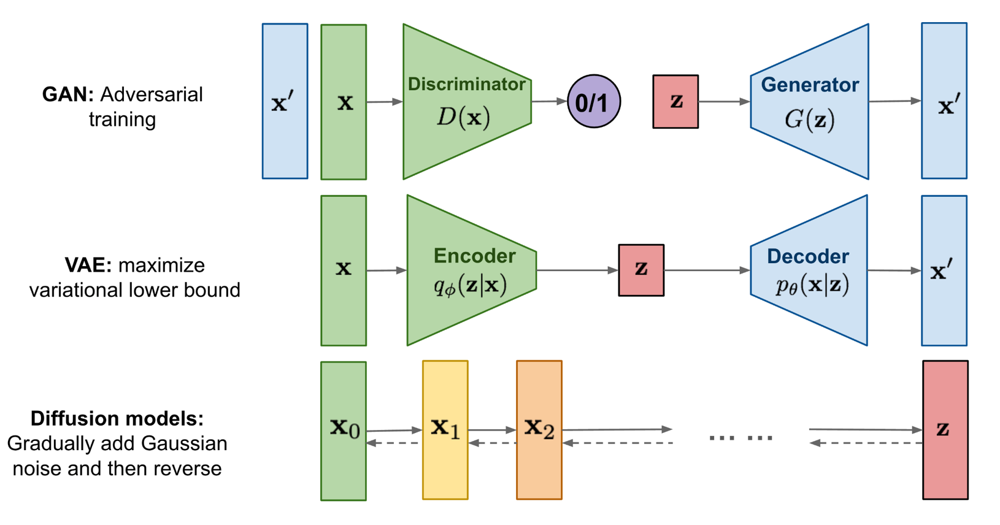

**NOTICE:** 
+ Please complete the code in the given structure. You may change the hyperparameters according to your computing power as long as the results indicate the desired performance.
+ Complete the `TODO` parts in the code accordingly. 
+ Remember to answer the conceptual questions. 

## Dataset

We are going to work on the FashionMNIST dataset. FashionMNIST consists of a training set of 60,000 examples and a test set of 10,000 samples. Each sample is a 28x28 grayscale image associated with a label from 10 classes. We are going to use the training split in this notebook. You can use `dataloader` to train your models. Also, you can use `plot_samples` to plot a sequence of images (e.g. iteratively denoised images by DDPM).

In [21]:
from torchvision import transforms 
from torch.utils.data import DataLoader
from torch import optim
from tqdm.notebook import tqdm
from torch.autograd import Variable 

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt

BATCH_SIZE = 1024
IMG_SIZE = 32 
C_IN = 1 # Number of input channels
LR = 5e-4
EPOCHS = 100

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

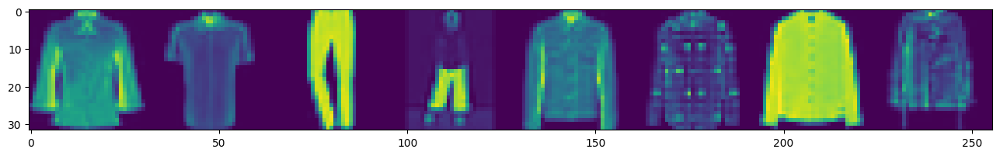

In [22]:
def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),  
        transforms.Lambda(lambda t: (t * 2) - 1) 
    ]

    data_transform = transforms.Compose(data_transforms)

    data = torchvision.datasets.FashionMNIST(root=".", download=True, 
                                         train=True, transform=data_transform)
    return data


def plot_images(images):
    plt.figure(figsize=(16, 3))
    plt.imshow(torch.cat([
        torch.cat([i for i in images], dim=-1)
    ], dim=-2).permute(1, 2, 0).cpu())
    plt.show()


data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, 
                        shuffle=True, drop_last=True)
batch_x, batch_y = next(iter(dataloader))
plot_images(batch_x[:8])

## VAE (38 points)

VAE is a generative model consisting of an encoder network and a decoder network. The encoder maps the input data into a latent space, where the data is represented by probability distributions. A decoder network generates the output data from samples of the latent space.

VAE is trained using a variational inference approach, where the goal is to maximize the evidence lower bound (ELBO) of the log-likelihood of the data. The ELBO consists of two terms: the reconstruction loss, which measures how well the decoder can reconstruct the input data from the latent space, and the KL divergence between the prior (considered Gaussian) and posterior distributions over the latent space. The posterior distribution is usually considered Gaussian, and the encoder only tries to learn its mean and variance. Given the mean and the variance, one can use the reparameterization trick to sample from the encoder.

### ❓ **Question 1**
*(8 points)*
+ What is the reparameterization trick? How does it affect the sampling and the gradient backpropagation processes?
+ What are the advantages of VAEs over regular Autoencoders?

### Solution to question 1:

**What is the reparameterization trick? How does it affect the sampling and the gradient backpropagation processes?**
+ Reparametrization Trick: This type sampling of z is random making z a stochastic node in neural network hence we cannot back propagate through that node. To overcome this, instead of randomly sampling $z_i$ from the $N(\mu_i, \sigma_i^2)$ VAE’S use a clever trick by introducing an error term $\epsilon$ where we randomly sample from $N(0,1)$ for each dimension of z to construct $z_i$ as $\mu_i + \epsilon * \sigma_i^2$  (* here mean element wise dot product). Now, the error term ϵ is now stochastic and z is deterministic and hence we can back-propagate through z. By sampling z from q(z|X) means if we try the same input x twice, we should get two different values for z this is achieved by introducing the random layer 𝜖. \\
The reparameterization trick is a technique used in Variational Autoencoders (VAEs) to optimize the model's parameters using gradient-based methods during training. This approach involves representing latent variables as a function of a noise variable, which is typically drawn from a unit Gaussian distribution. By doing so, it becomes possible to sample from the latent space using a simple random variable instead of directly sampling from the complex distribution that the model has learned. \\
This trick offers two key benefits: firstly, it enables efficient sampling from the latent space during both training and inference, which is essential for generating new samples from the model. Secondly, it allows backpropagation to estimate gradients with respect to the model's parameters, streamlining the optimization process during training. \\
In practice, during training, the reparameterization trick adds a separate set of parameters that are optimized together with the other model parameters. These parameters map the sampled noise variable to the resulting latent code via the reparameterization function. The gradients of the model are then estimated using the chain rule of differentiation, treating this mapping as just another layer of the network. 

**What are the advantages of VAEs over regular Autoencoders?** \\
Variational Autoencoders (VAEs) have several advantages over regular autoencoders:

+ Better Generative Modeling: VAEs are better at generating new data points that closely resemble the original dataset. This is because they learn a probability distribution over the input data, allowing them to generate new samples by sampling from this learned distribution.

+ Latent Space Regularization: VAEs enforce a regularization on the latent space by forcing it to follow a Gaussian distribution. This helps in avoiding overfitting and improving generalization performance.

+ Continuous Latent Space: VAEs learn a continuous latent space representation of the input data, which enables them to perform operations like interpolation, sampling, and manipulation of the latent space. This makes VAEs useful in applications such as image and speech generation.

+ Ability to Handle Missing Data: VAEs can handle missing data seamlessly, since they can generate plausible values for missing data by sampling from the learned distribution.

In [ ]:
class VariationalEncoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalEncoder, self).__init__()

        ##########################################################
        # TODO (4 points): 
        # Define your variational encoder layers. You may use 
        # linear layers, normalization layers, and activation layers. 
        ##########################################################
        self.latent_dims = latent_dims
        self.model = nn.Sequential(
            nn.Linear(IMG_SIZE * IMG_SIZE * C_IN, 256), 
            nn.ReLU()
        )
        self.mu = nn.Linear(256, latent_dims)
        self.logvar = nn.Linear(256, latent_dims)

        

    def forward(self, x):

        ##########################################################
        # TODO (8 points): 
        # Convert `x` to the latent `z`. You should first calculate 
        # the mean and the variance for the current input `x` 
        # and then, sample a standard Gaussian noise. Finally convert 
        # the noise to `z` using the mean and the variance.
        ##########################################################
      
        x = x.view(-1, C_IN * IMG_SIZE * IMG_SIZE)
        x = self.model(x)

        mu = self.mu(x)
        logvar = self.logvar(x)
        
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        z = mu + eps*std
        
        return z, mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dims):
        super(Decoder, self).__init__()        
        
        ##########################################################
        # TODO (2 points): 
        # Define your decoder layers. You may use linear layers, 
        # normalization layers, and activation layers. 
        ##########################################################

        self.model = nn.Sequential(
            nn.Linear(latent_dims, 256),
            nn.ReLU(),
            nn.Linear(256, C_IN * IMG_SIZE * IMG_SIZE),
            nn.Sigmoid()
        )


    def forward(self, z):

        img = None
        ##########################################################
        # TODO (2 points): 
        # Decode the latent vector `z` to images.
        ##########################################################
        img = self.model(z).view(-1, C_IN, IMG_SIZE, IMG_SIZE)
        return img

class VariationalAutoEncoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoEncoder, self).__init__()

        ##########################################################
        # TODO (2 points): 
        # Instantiate the encoder and the decoder.
        ##########################################################

        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        z, mu, logvar = self.encoder(x)
        return self.decoder(z), mu, logvar

class VAEManager():
    def __init__(self, latent_dims):

        ##########################################################
        # TODO (1 points): 
        # Define the VAE and the optimizer. You can use Adam.
        ##########################################################

        self.vae = VariationalAutoEncoder(latent_dims).to(DEVICE)
        self.optimizer = torch.optim.Adam(self.vae.parameters(), lr=LR)

    def train(self, dataloader):

        history = dict(loss=[])
        for epoch in range(EPOCHS):
            total_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE) 

                ##########################################################
                # TODO (8 points): 
                # Calculate the loss.
                # Then, perform the optimization on `batch_x`.
                #########################################################

                self.optimizer.zero_grad()
                reconstructed_batch, mu, sigma = self.vae(batch_x)
                recons_loss = nn.functional.binary_cross_entropy(reconstructed_batch
                , batch_x, reduction='sum')
                kl_loss = - torch.sum(1 + torch.log(sigma.pow(2)) - mu.pow(2) - sigma.pow(2))
                loss = recons_loss + kl_loss
                loss.backward()
                self.optimizer.step()



                total_loss.append(loss.item())

            mean_loss = np.mean(total_loss)

            print(
                "[Epoch: %d/%d] [loss: %.4f]"
                % (epoch+1, EPOCHS, mean_loss)
            )

            self.sample(8, plot=True)

            history['loss'].append(mean_loss)

        return history

    def sample(self, n, plot=True):

        ##########################################################
        # TODO (3 points): 
        # Interpolate between two randomly chosen points in the latent space,
        # and choose `n` equally-distant latent points between the random points.
        # You should save an array of random latent points in `zs`.
        ##########################################################
        
        a = torch.randn(1, self.vae.encoder.latent_dims).to(DEVICE)
        b = torch.randn(1, self.vae.encoder.latent_dims).to(DEVICE)

        zs = []
        for i in range(n):
          z = a + (b - a) * i / (n - 1)
          zs.append(z)

        zs = torch.stack(zs).to(DEVICE)

        with torch.no_grad():
            images = torch.cat([self.vae.decoder(z) for z in zs], dim=0).detach()
            if plot:
                plot_images(images)
            return images

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 1/200] [loss: -356493.5863]


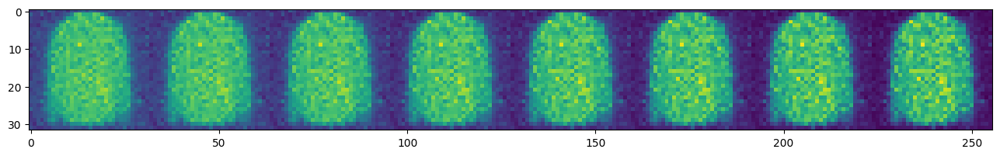

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 2/200] [loss: -364349.6096]


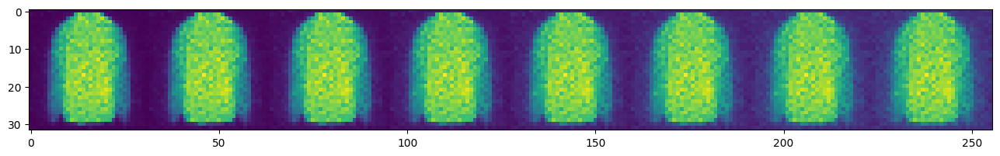

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 3/200] [loss: -363392.2585]


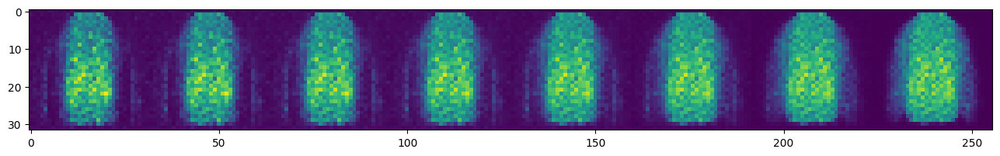

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 4/200] [loss: -353608.1916]


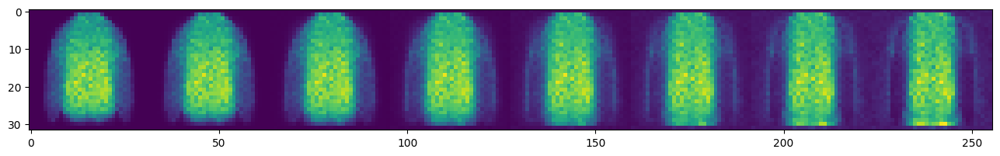

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 5/200] [loss: -348905.2989]


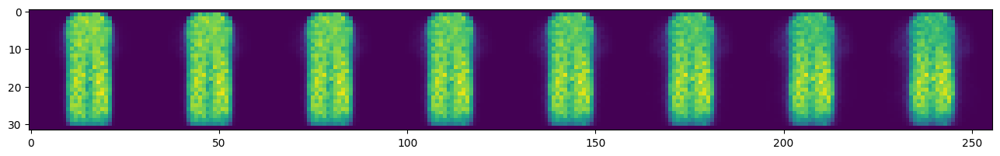

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 6/200] [loss: -346510.3068]


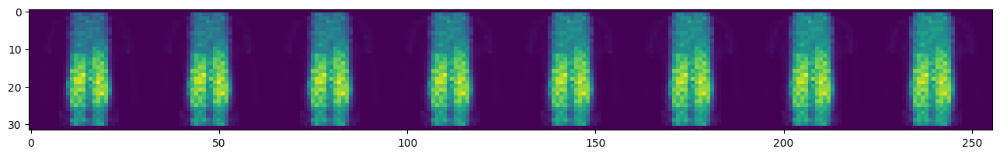

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 7/200] [loss: -349931.9294]


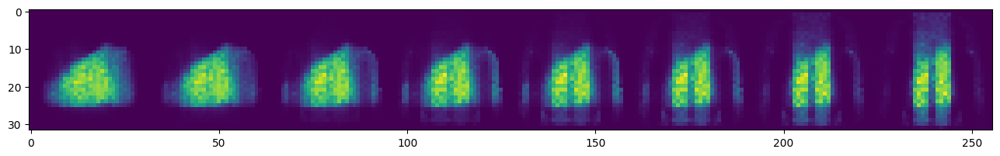

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 8/200] [loss: -356027.5571]


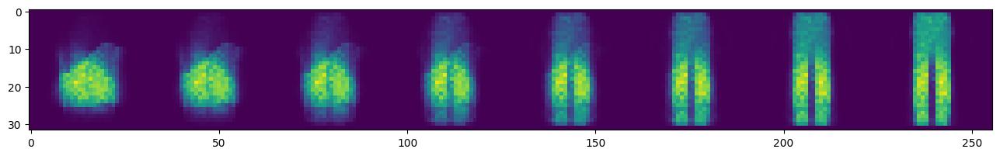

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 9/200] [loss: -361071.0500]


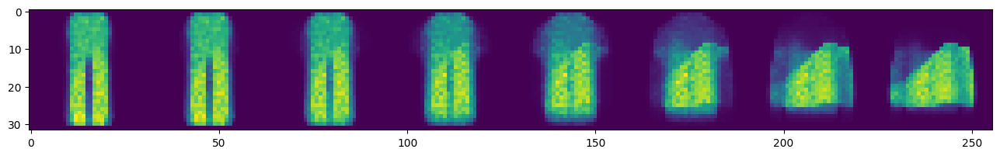

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 10/200] [loss: -364327.9830]


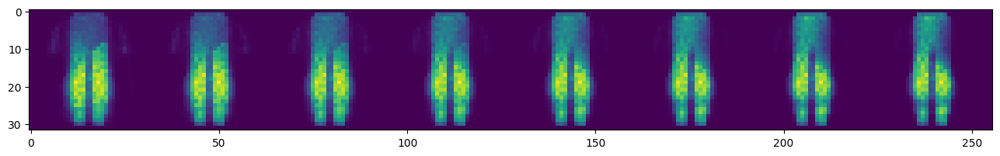

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 11/200] [loss: -367897.8766]


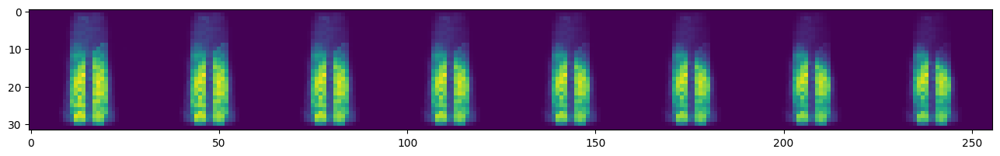

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 12/200] [loss: -372066.4728]


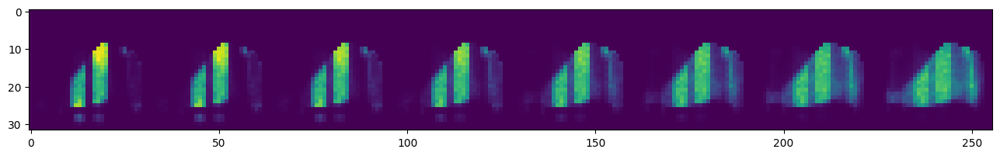

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 13/200] [loss: -374854.0233]


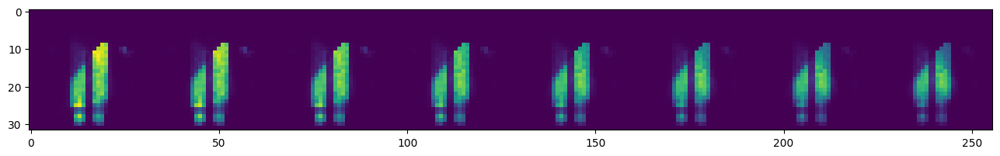

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 14/200] [loss: -376828.4259]


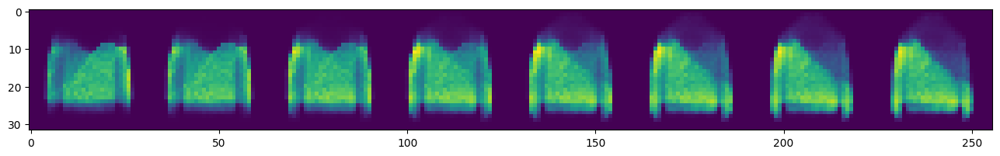

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 15/200] [loss: -378453.2883]


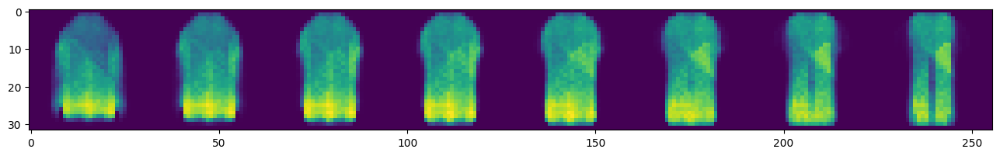

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 16/200] [loss: -380137.1877]


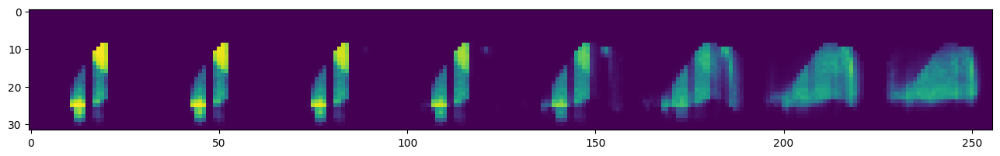

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 17/200] [loss: -381044.5785]


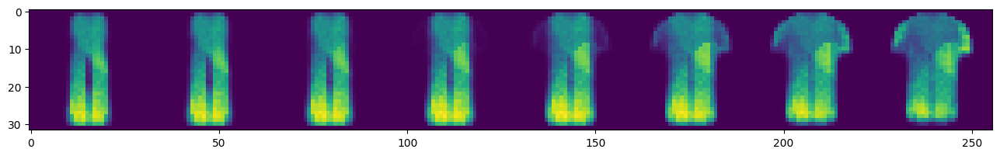

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 18/200] [loss: -382711.0945]


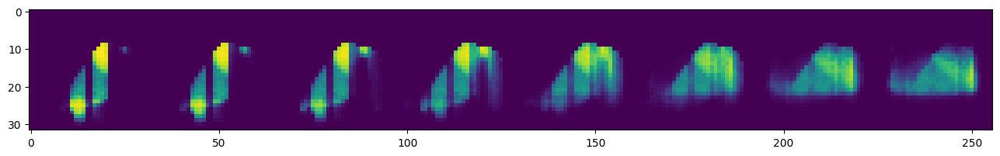

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 19/200] [loss: -384158.1072]


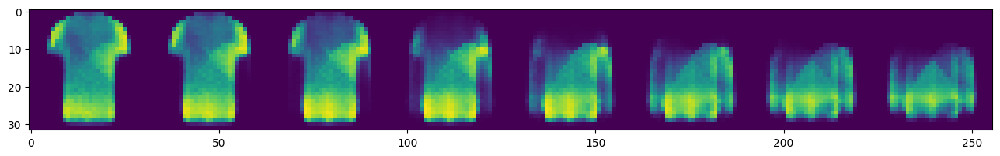

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 20/200] [loss: -385409.1164]


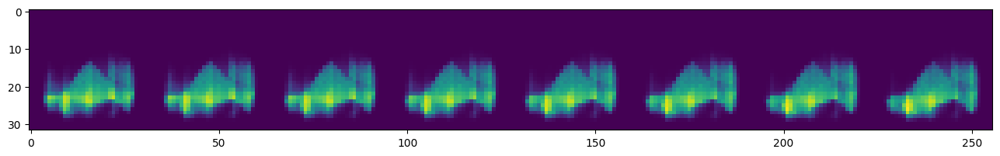

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 21/200] [loss: -386452.7768]


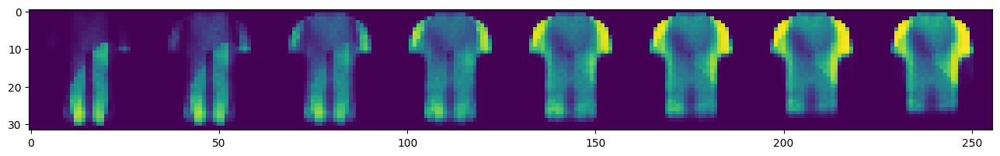

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 22/200] [loss: -387387.3336]


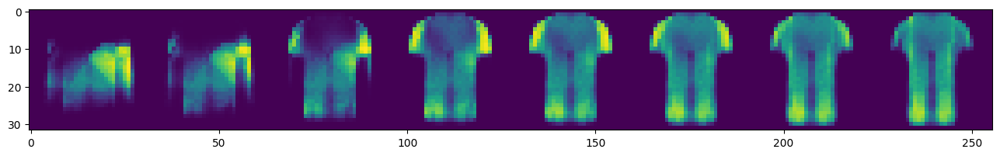

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 23/200] [loss: -388585.6966]


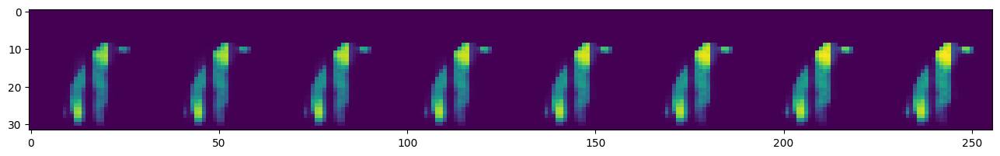

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 24/200] [loss: -389981.7439]


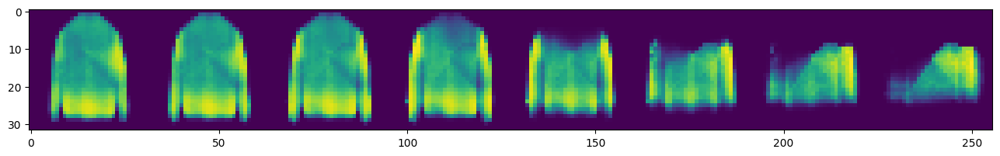

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 25/200] [loss: -391070.3399]


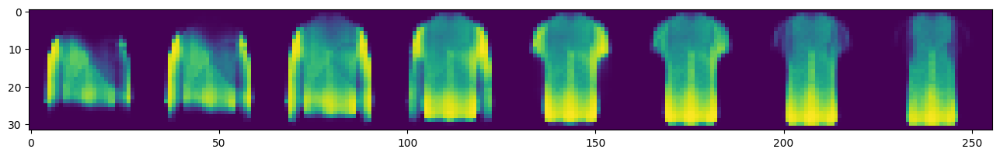

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 26/200] [loss: -392206.1582]


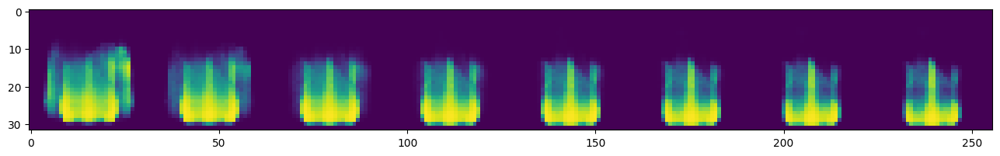

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 27/200] [loss: -392851.2316]


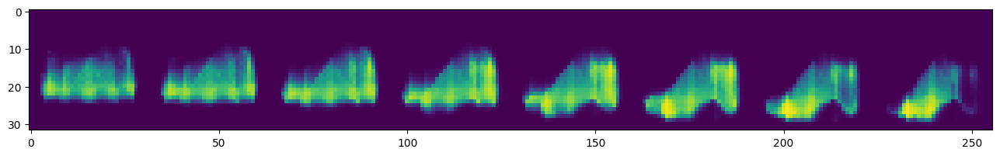

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 28/200] [loss: -394031.3813]


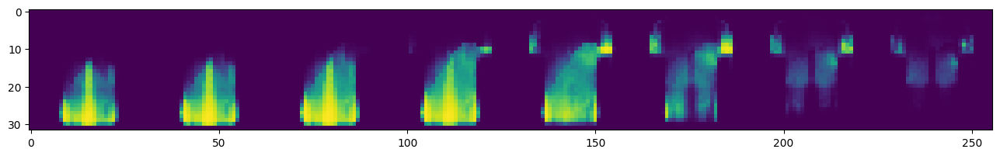

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 29/200] [loss: -394741.0836]


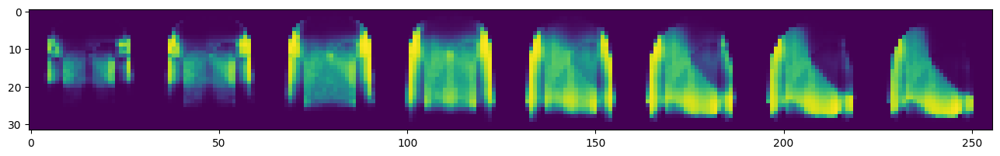

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 30/200] [loss: -394917.8057]


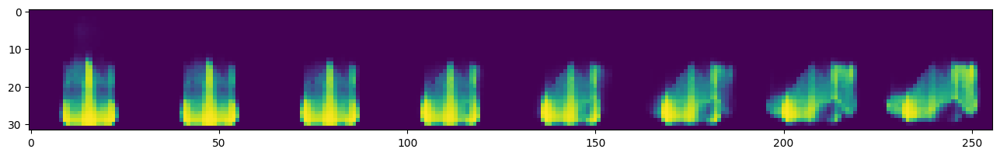

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 31/200] [loss: -396297.9412]


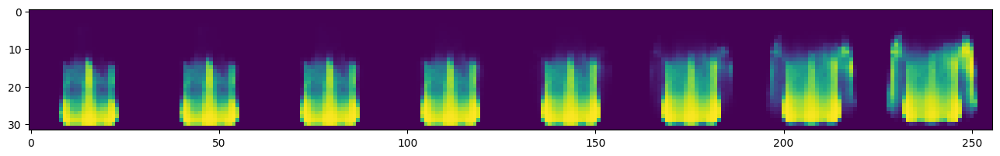

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 32/200] [loss: -397080.2456]


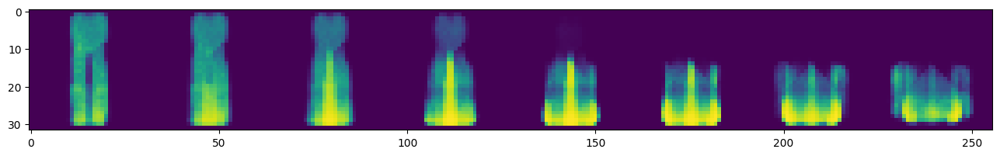

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 33/200] [loss: -397614.0073]


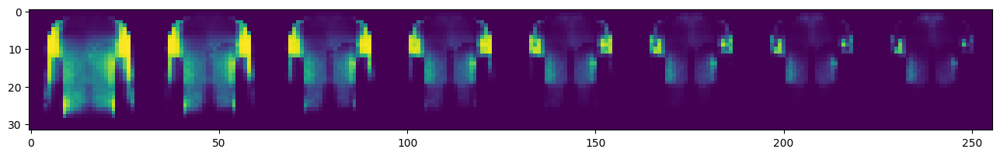

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 34/200] [loss: -398671.6836]


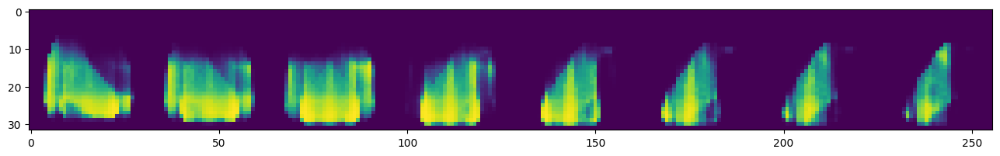

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 35/200] [loss: -399266.1776]


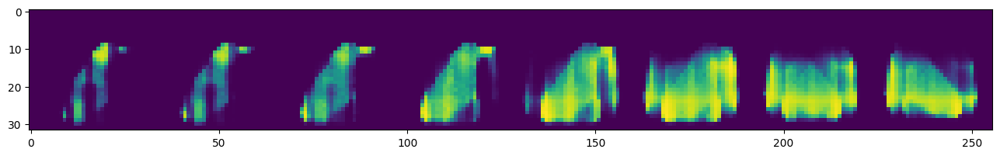

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 36/200] [loss: -400211.3915]


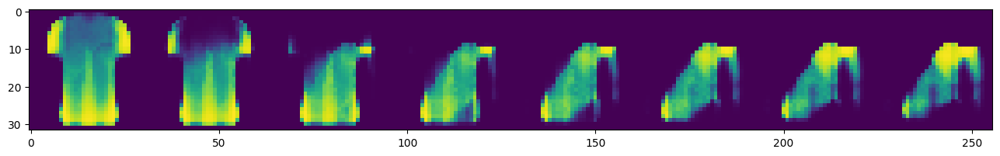

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 37/200] [loss: -400473.9523]


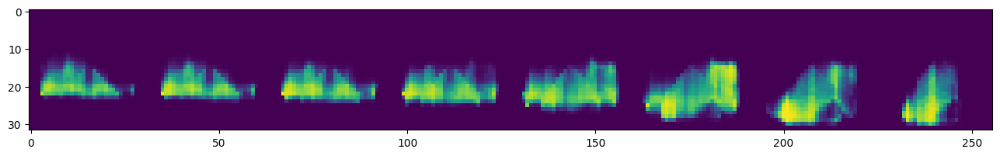

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 38/200] [loss: -401268.9947]


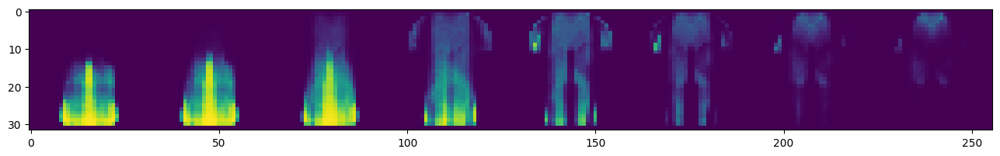

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 39/200] [loss: -401815.2736]


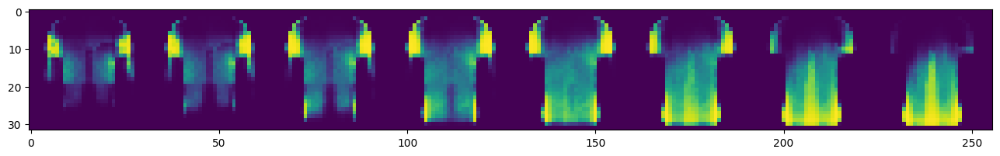

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 40/200] [loss: -402149.2680]


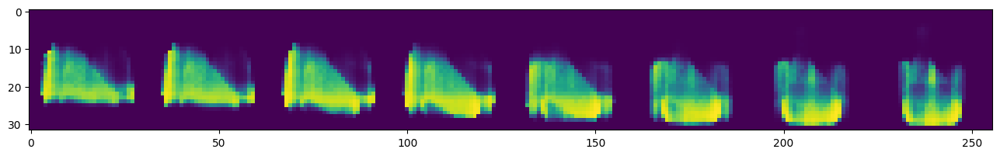

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 41/200] [loss: -402795.3471]


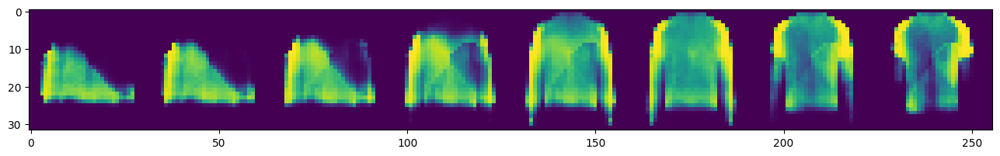

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 42/200] [loss: -403131.1428]


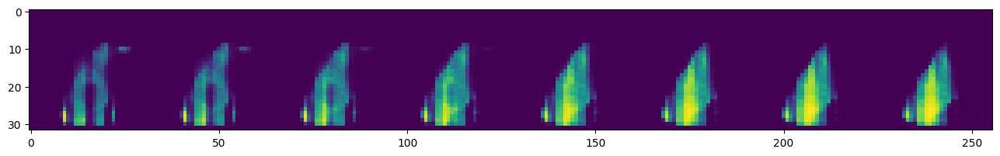

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 43/200] [loss: -403808.2386]


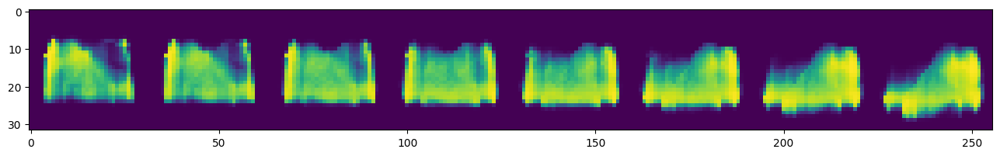

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 44/200] [loss: -404420.0323]


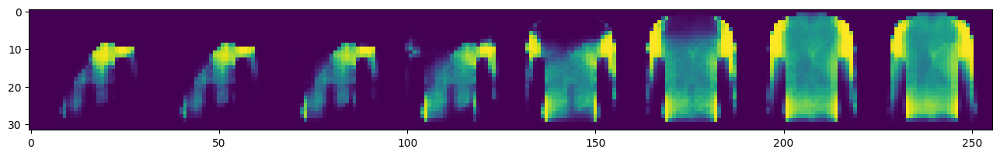

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 45/200] [loss: -404630.6298]


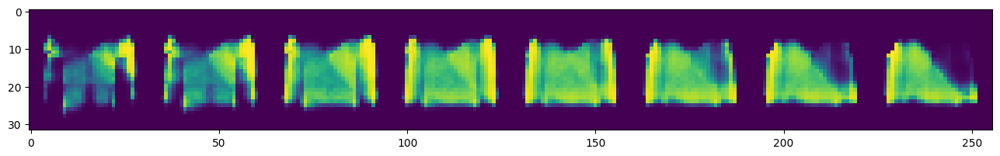

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 46/200] [loss: -405281.2543]


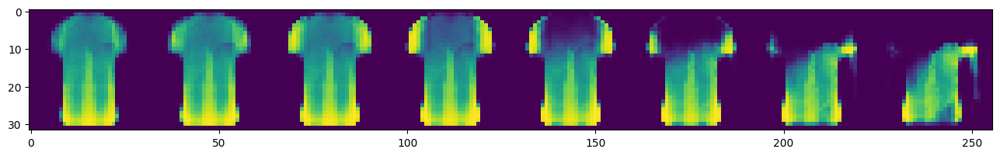

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 47/200] [loss: -405725.2060]


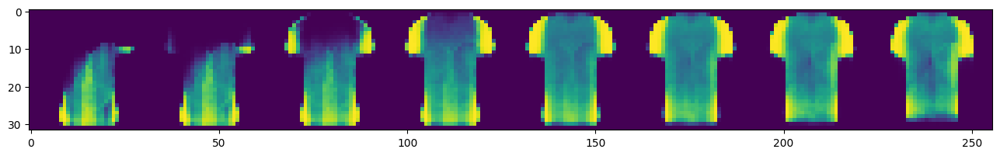

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 48/200] [loss: -406134.0531]


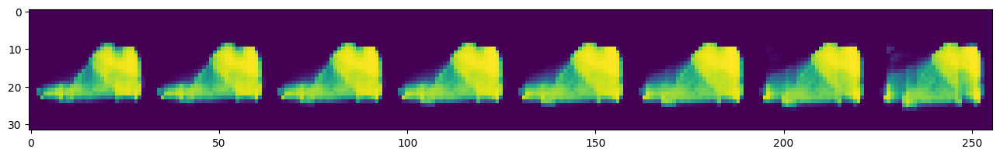

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 49/200] [loss: -406507.6762]


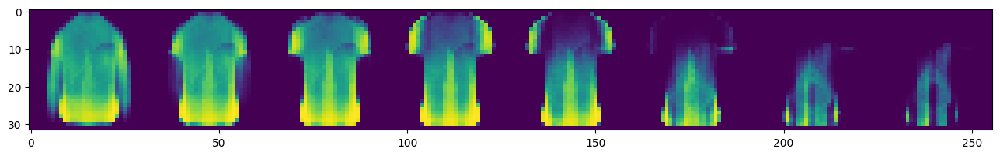

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 50/200] [loss: -406416.1895]


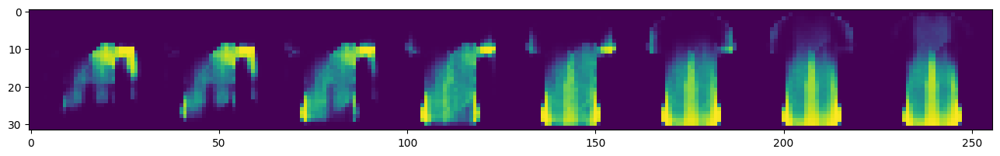

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 51/200] [loss: -407065.7513]


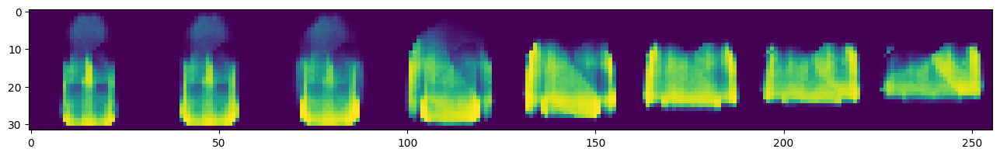

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 52/200] [loss: -407603.4693]


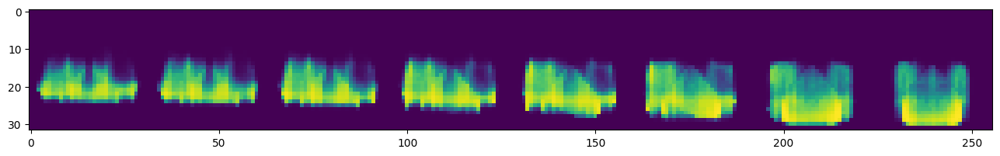

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 53/200] [loss: -407912.2072]


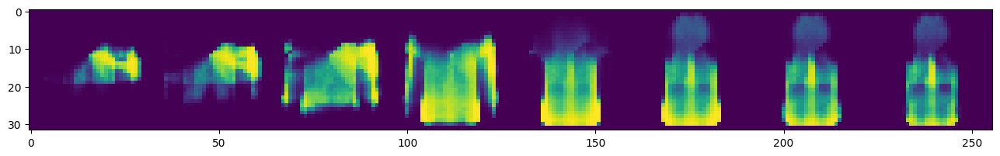

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 54/200] [loss: -408356.4171]


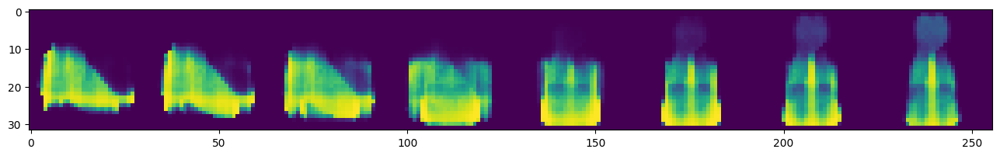

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 55/200] [loss: -408573.1927]


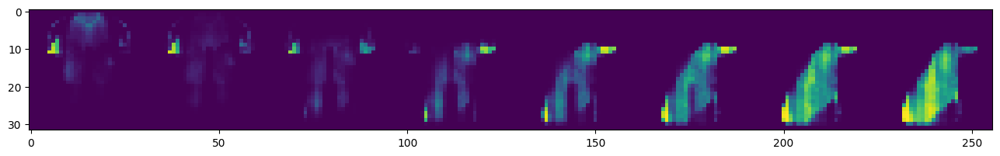

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 56/200] [loss: -408772.2324]


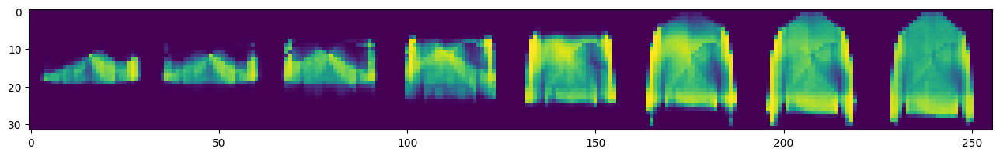

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 57/200] [loss: -409311.7413]


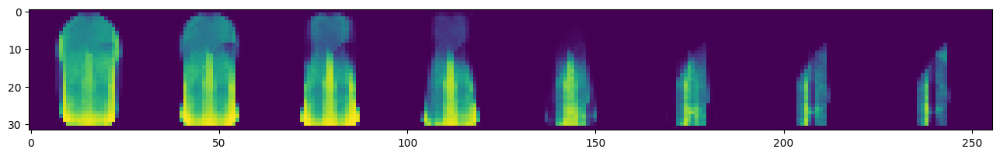

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 58/200] [loss: -409449.1599]


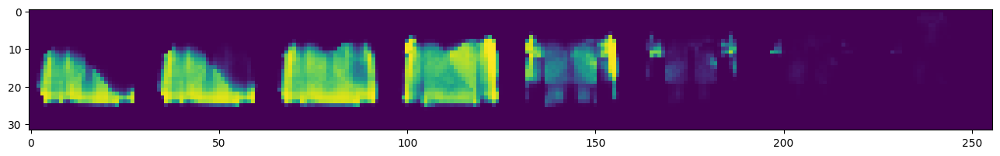

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 59/200] [loss: -409754.9249]


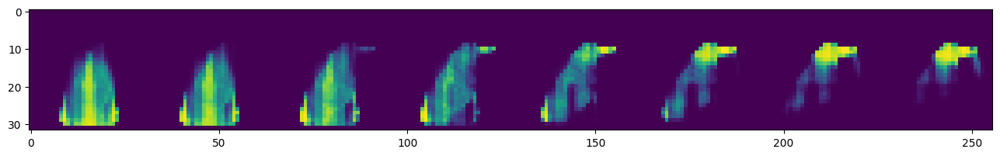

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 60/200] [loss: -410237.4792]


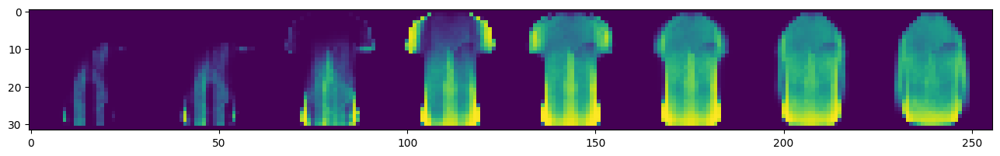

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 61/200] [loss: -410226.8142]


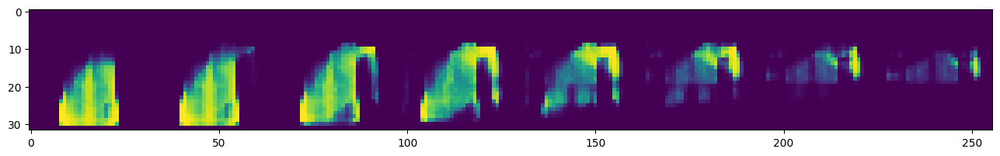

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 62/200] [loss: -410930.9692]


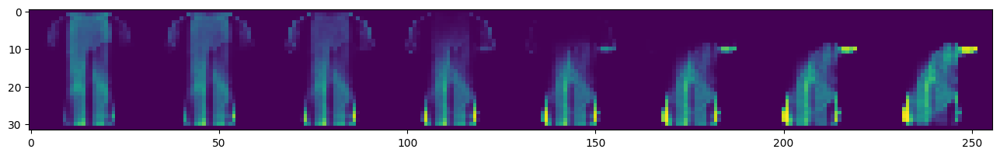

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 63/200] [loss: -411147.2796]


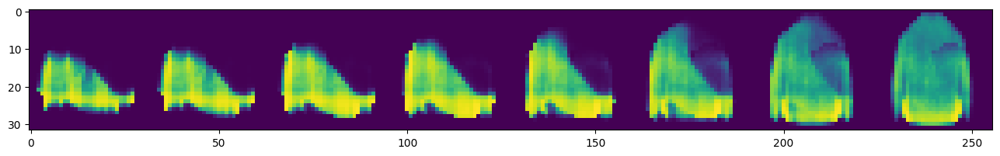

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 64/200] [loss: -411459.7096]


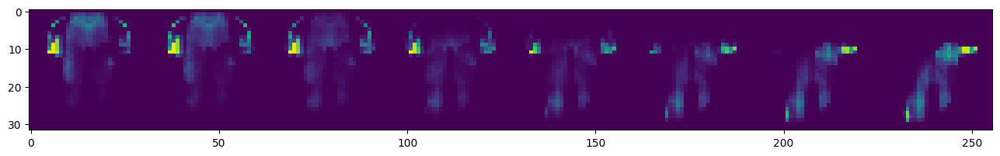

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 65/200] [loss: -411871.5761]


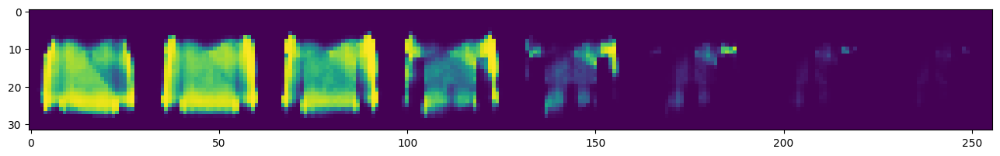

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 66/200] [loss: -411926.3185]


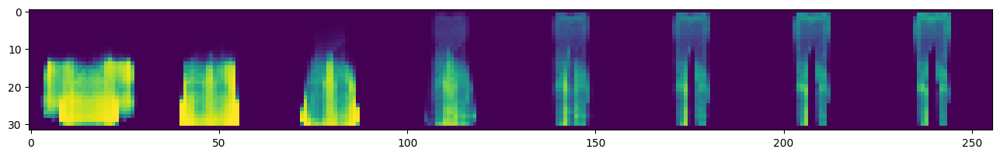

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 67/200] [loss: -412340.0241]


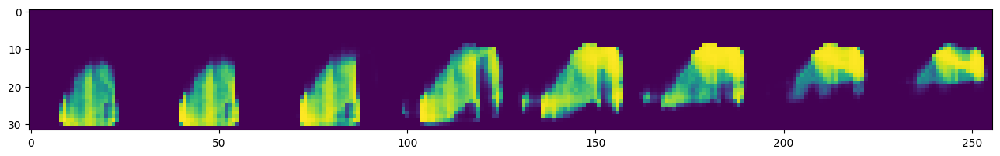

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 68/200] [loss: -412480.7540]


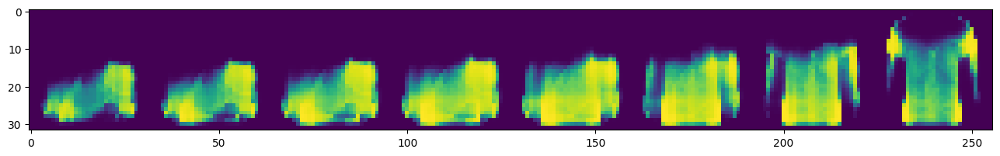

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 69/200] [loss: -412622.8095]


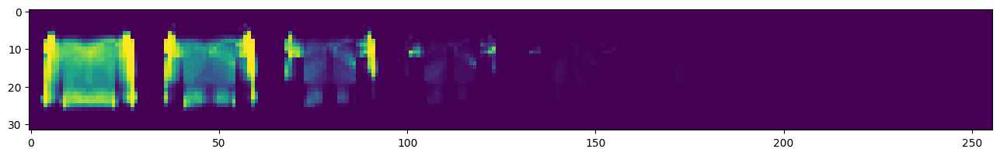

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 70/200] [loss: -412983.8137]


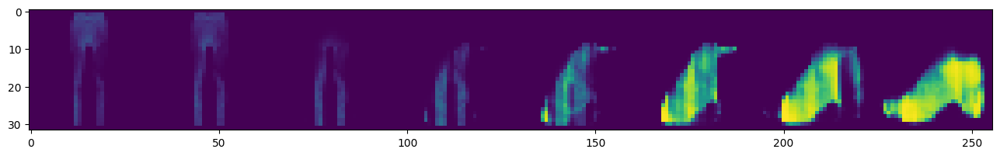

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 71/200] [loss: -413245.8865]


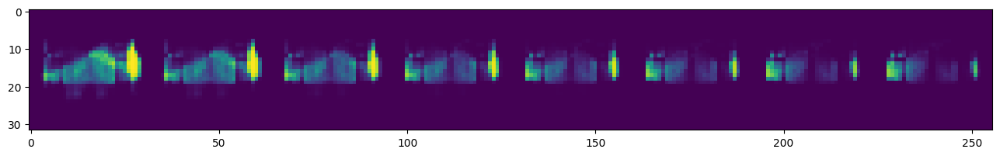

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 72/200] [loss: -413387.0296]


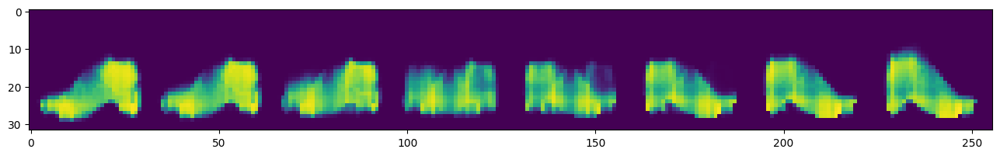

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 73/200] [loss: -413608.2696]


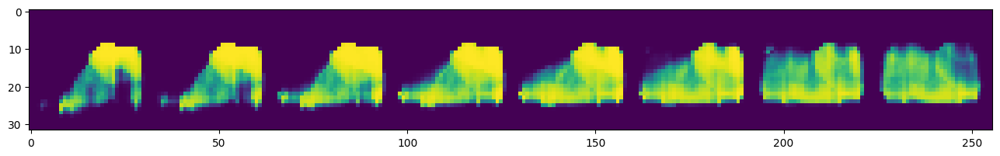

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 74/200] [loss: -413636.0948]


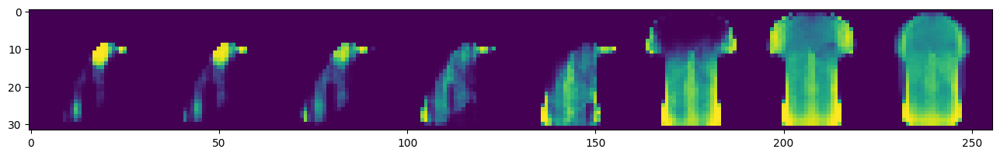

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 75/200] [loss: -413942.7393]


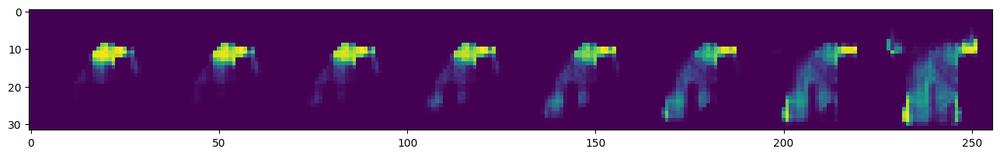

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 76/200] [loss: -414356.3424]


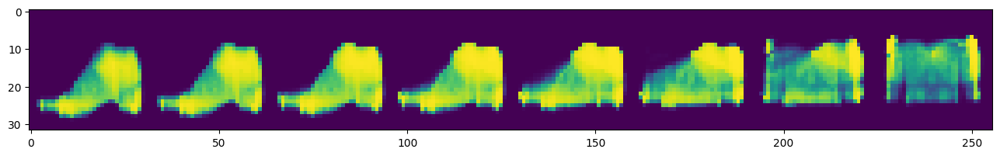

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 77/200] [loss: -414540.4522]


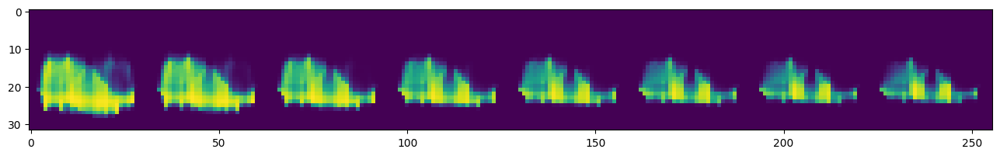

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 78/200] [loss: -414734.2066]


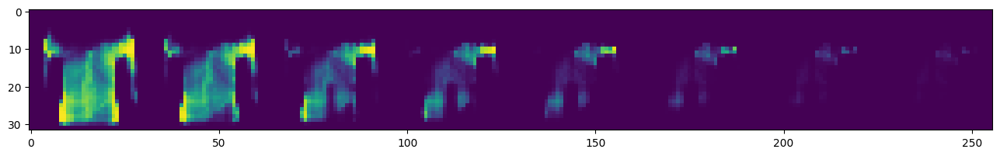

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 79/200] [loss: -414808.8898]


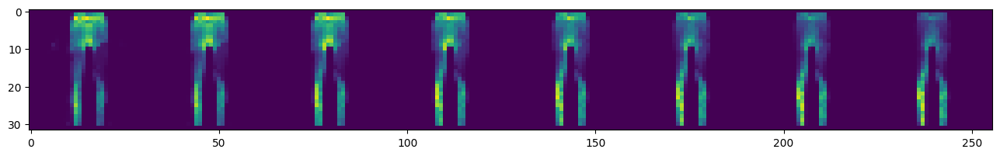

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 80/200] [loss: -415052.5361]


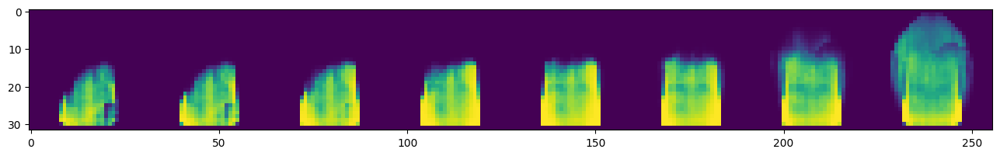

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 81/200] [loss: -415096.1050]


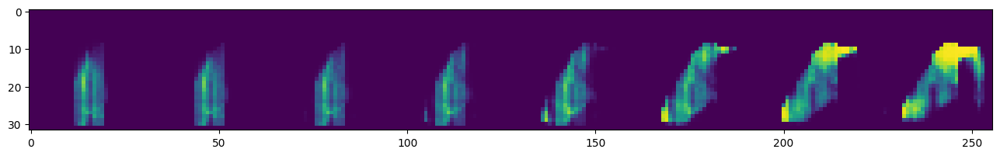

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 82/200] [loss: -415482.1950]


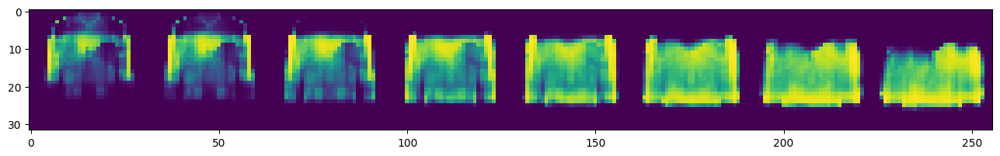

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 83/200] [loss: -415633.8897]


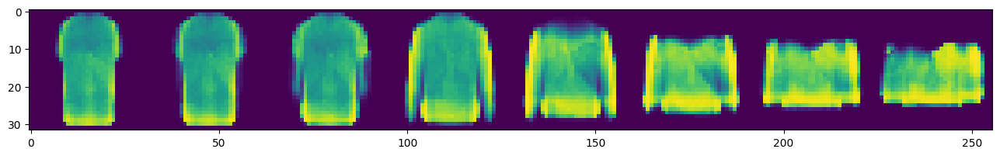

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 84/200] [loss: -415946.9718]


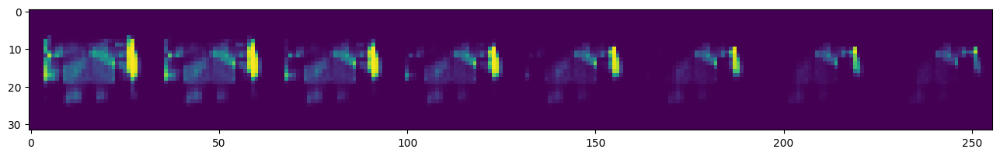

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 85/200] [loss: -415970.1562]


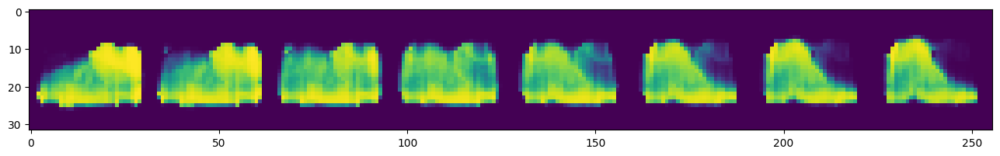

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 86/200] [loss: -416224.9539]


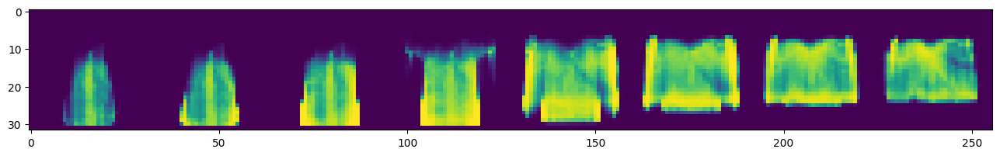

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 87/200] [loss: -416273.3903]


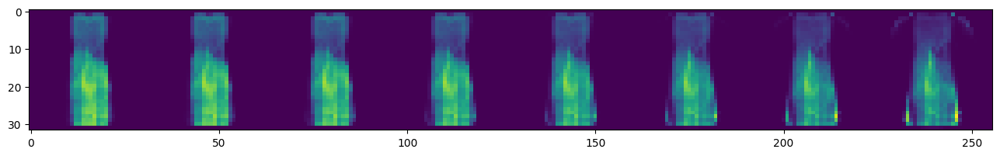

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 88/200] [loss: -416590.9112]


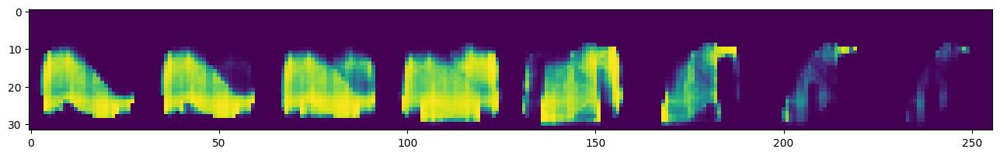

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 89/200] [loss: -416700.7871]


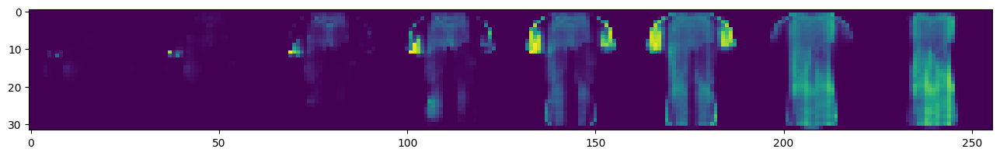

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 90/200] [loss: -416946.0221]


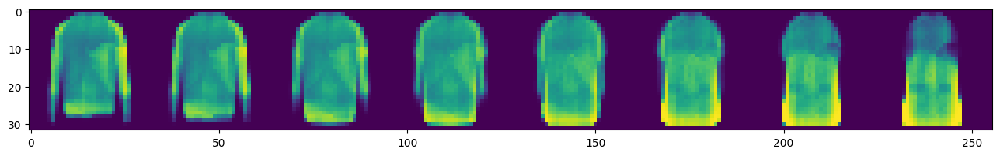

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 91/200] [loss: -416943.3263]


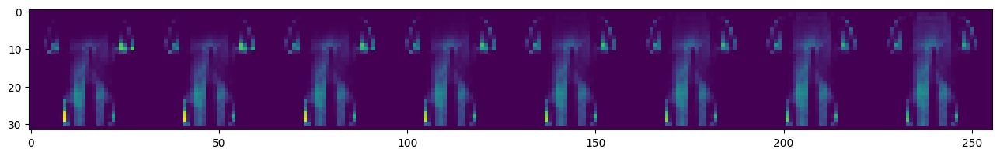

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 92/200] [loss: -417507.0445]


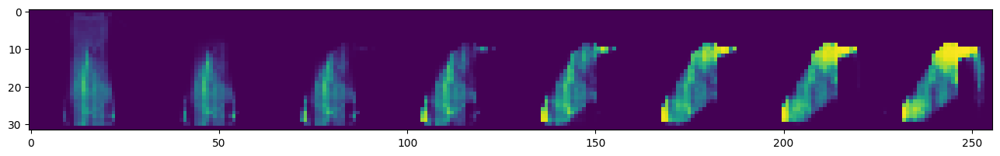

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 93/200] [loss: -417421.0349]


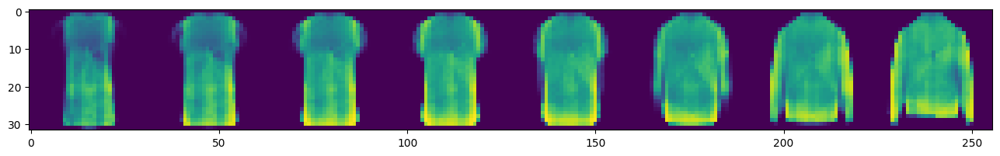

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 94/200] [loss: -417403.9397]


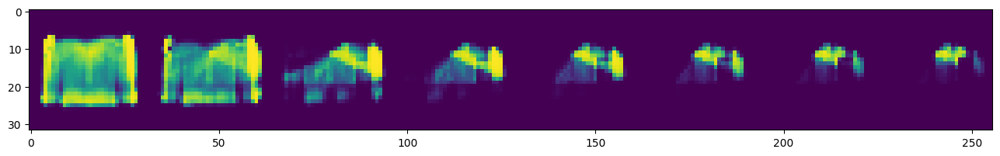

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 95/200] [loss: -417215.3867]


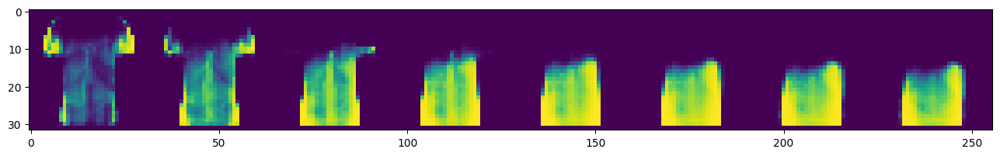

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 96/200] [loss: -418029.6093]


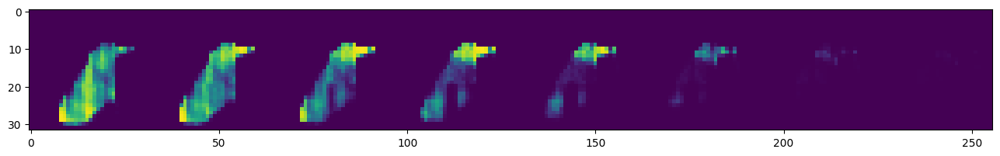

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 97/200] [loss: -418140.1847]


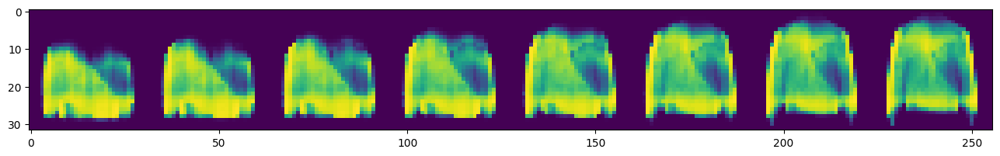

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 98/200] [loss: -418390.8500]


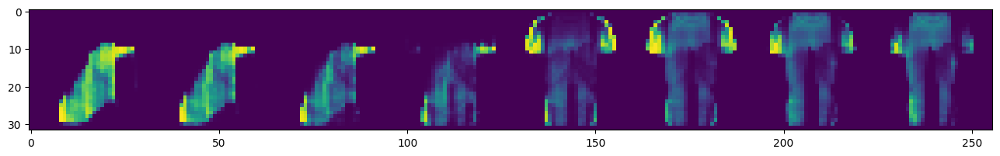

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 99/200] [loss: -418343.0061]


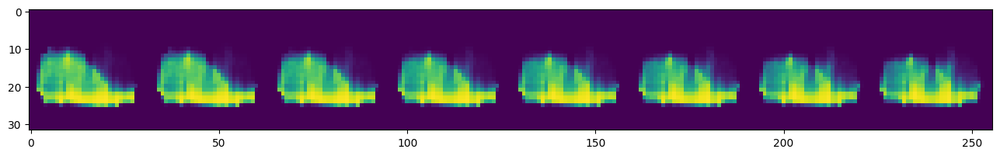

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 100/200] [loss: -418376.6123]


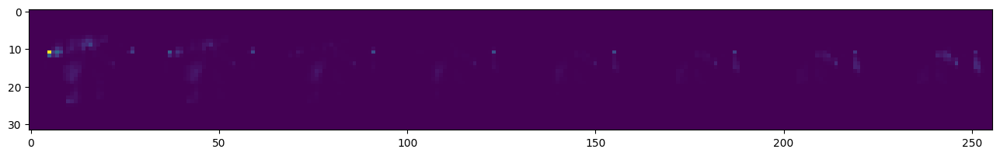

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 101/200] [loss: -418308.5654]


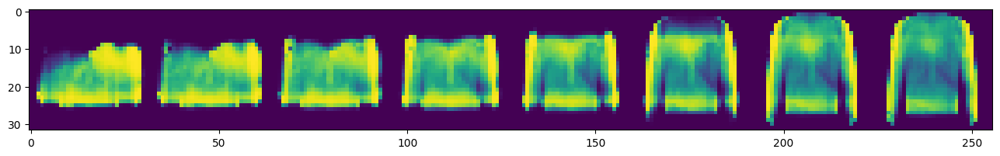

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 102/200] [loss: -418600.4809]


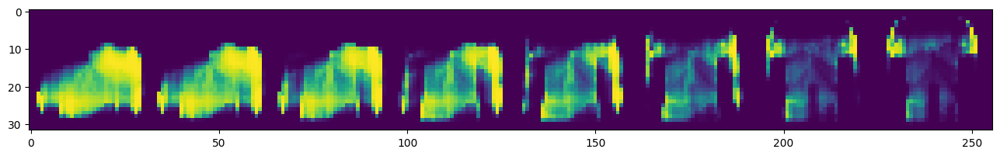

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 103/200] [loss: -418692.7970]


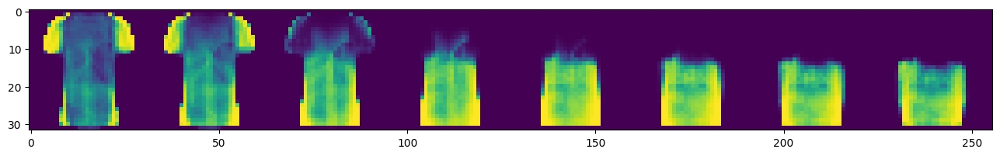

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 104/200] [loss: -418952.0001]


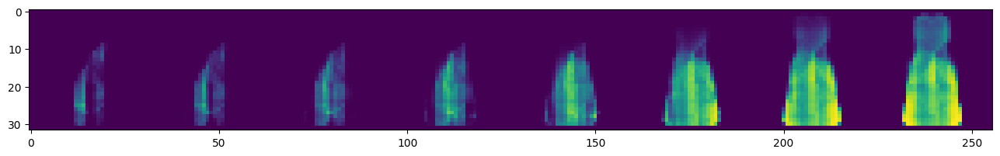

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 105/200] [loss: -419004.3911]


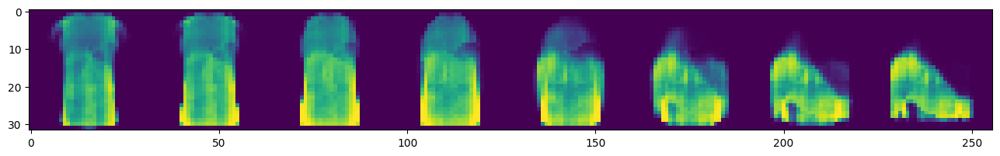

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 106/200] [loss: -419257.0217]


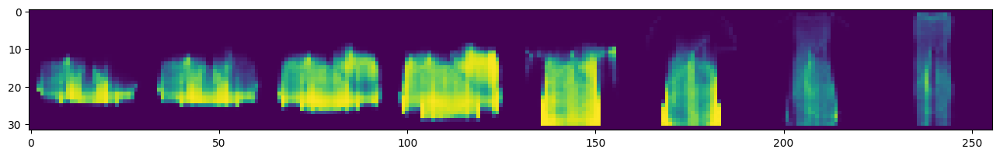

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 107/200] [loss: -419308.4203]


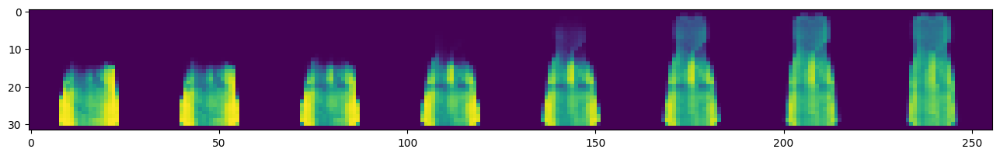

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 108/200] [loss: -419106.2376]


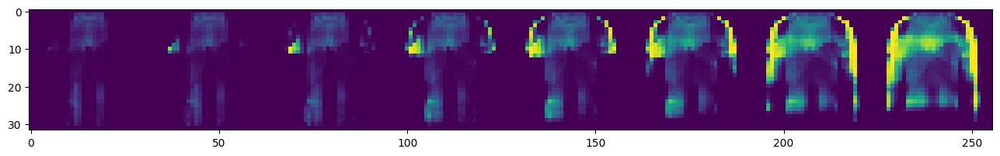

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 109/200] [loss: -419247.2042]


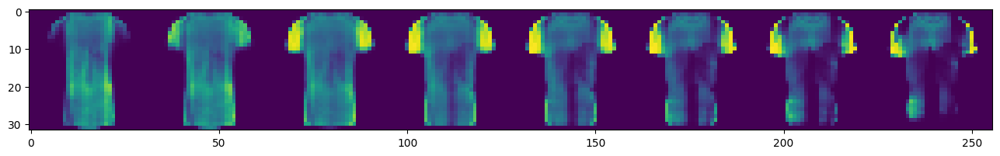

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 110/200] [loss: -419714.5153]


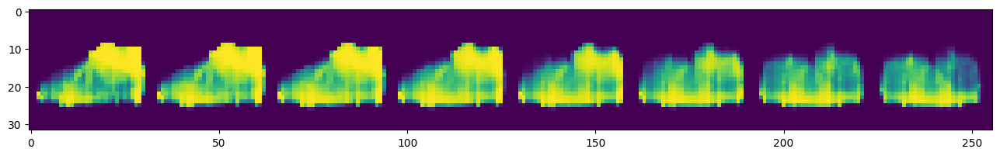

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 111/200] [loss: -419837.5104]


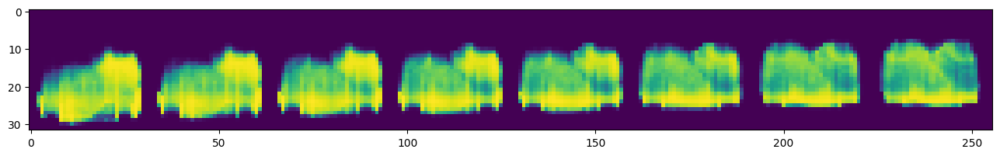

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 112/200] [loss: -419865.8912]


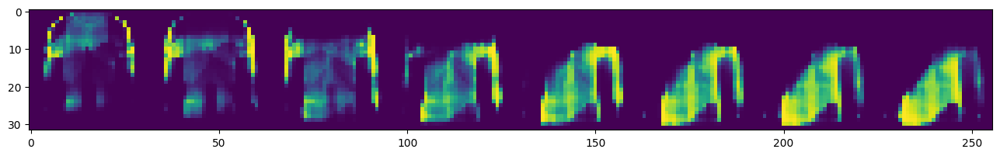

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 113/200] [loss: -420017.4434]


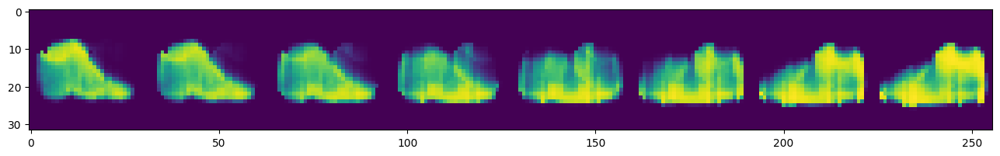

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 114/200] [loss: -420327.6276]


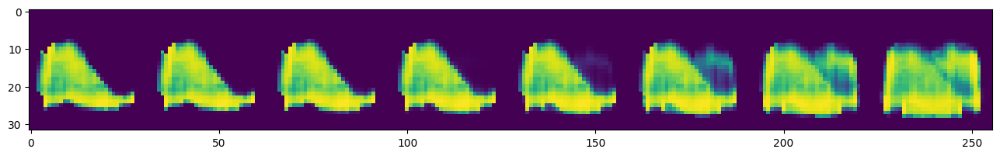

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 115/200] [loss: -420340.6360]


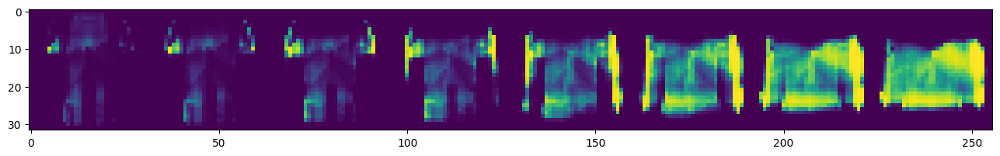

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 116/200] [loss: -420387.9942]


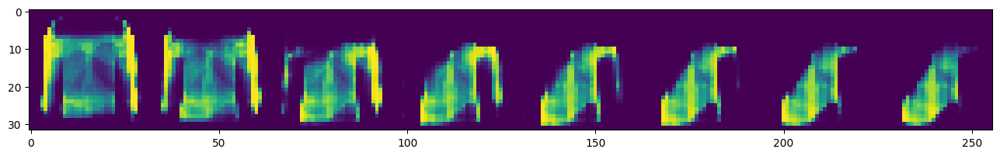

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 117/200] [loss: -420624.7031]


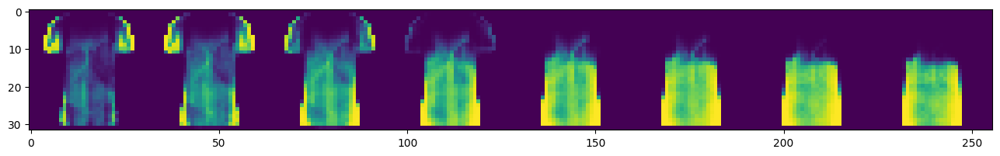

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 118/200] [loss: -420541.9948]


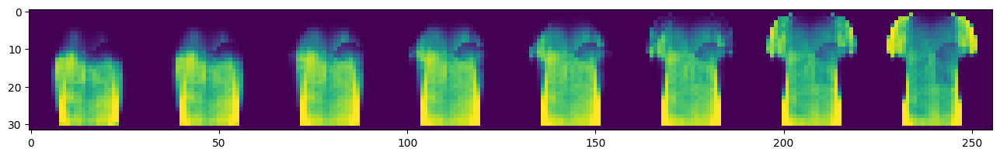

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 119/200] [loss: -420626.4608]


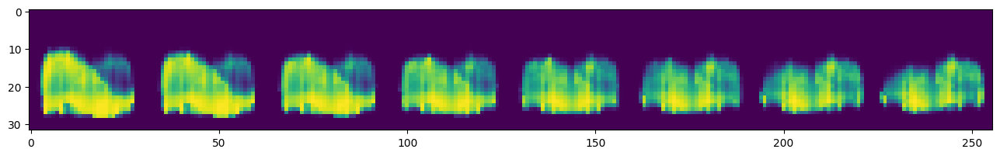

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 120/200] [loss: -420943.5357]


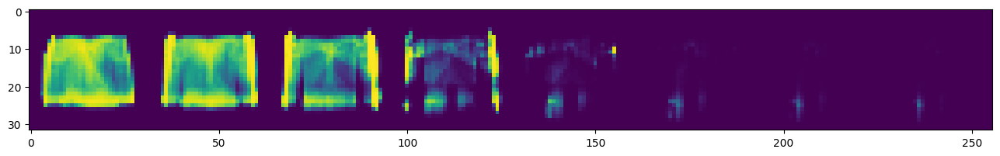

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 121/200] [loss: -421013.7421]


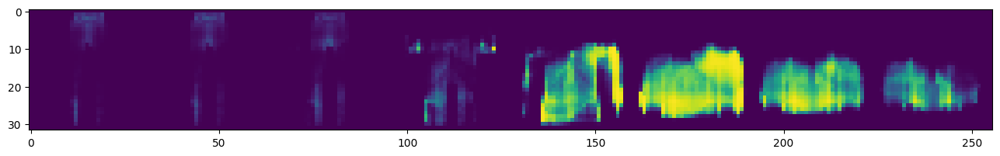

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 122/200] [loss: -421052.7993]


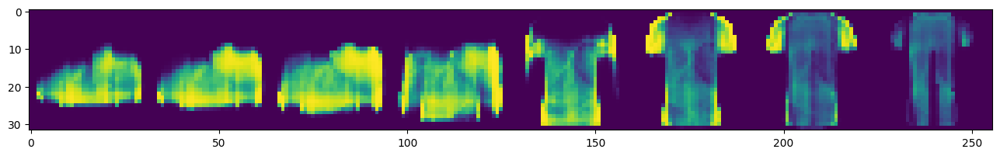

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 123/200] [loss: -421168.4824]


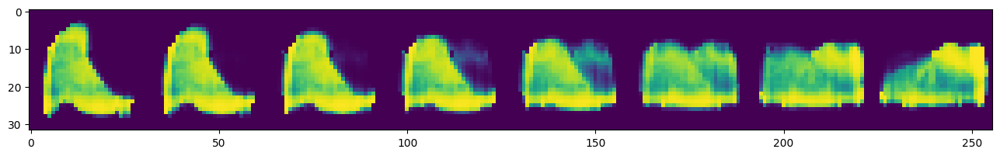

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 124/200] [loss: -421286.5498]


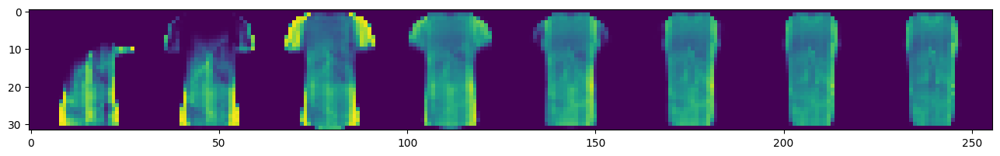

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 125/200] [loss: -421413.6357]


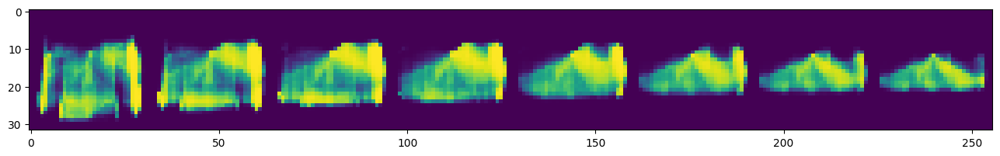

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 126/200] [loss: -421688.2949]


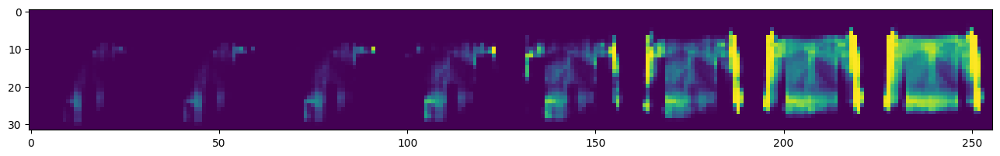

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 127/200] [loss: -421772.0252]


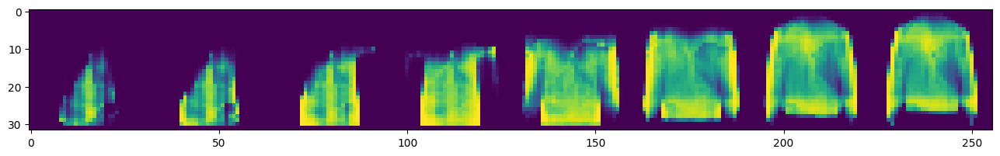

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 128/200] [loss: -421796.8898]


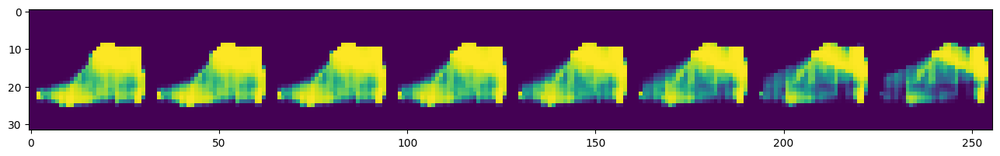

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 129/200] [loss: -421713.1042]


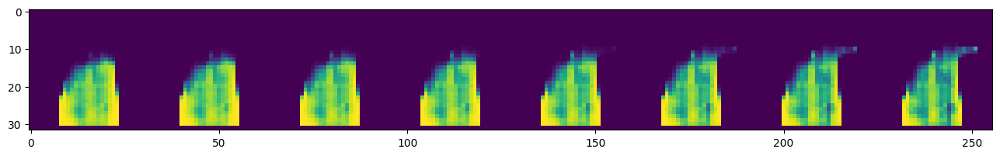

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 130/200] [loss: -421932.8037]


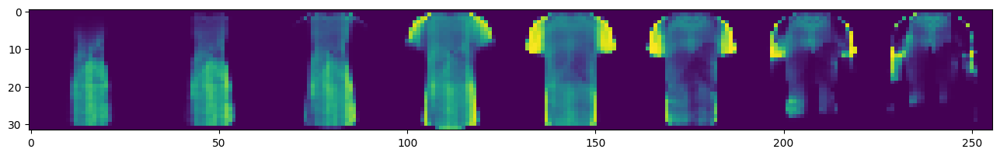

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 131/200] [loss: -422120.8906]


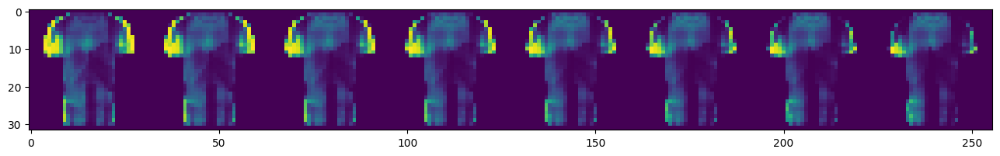

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 132/200] [loss: -422223.9602]


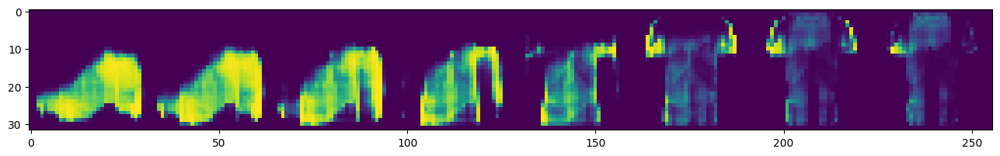

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 133/200] [loss: -422200.4678]


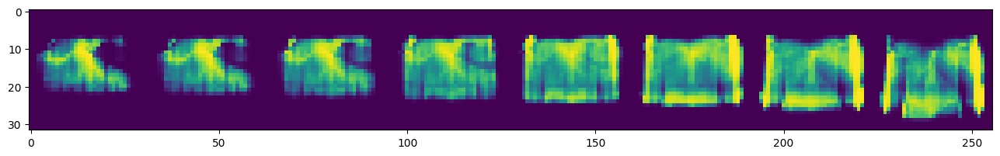

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 134/200] [loss: -422294.5497]


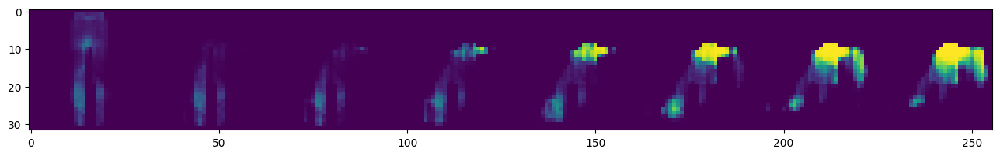

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 135/200] [loss: -422326.1179]


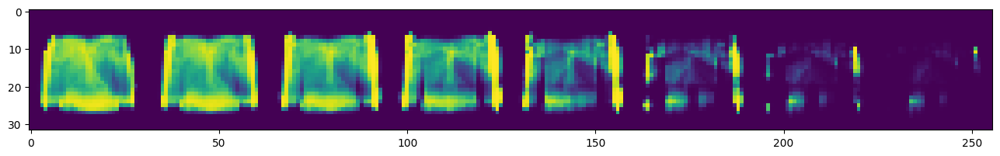

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 136/200] [loss: -422451.2222]


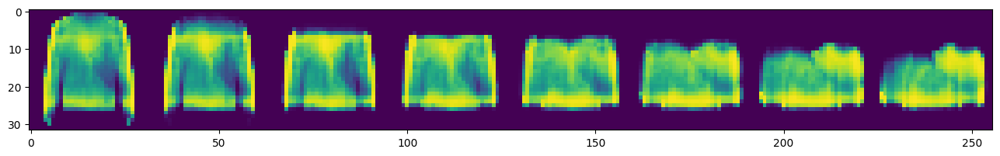

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 137/200] [loss: -422627.7127]


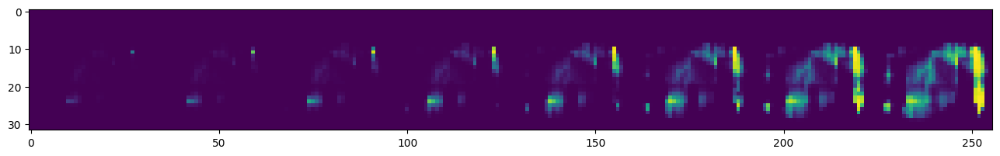

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 138/200] [loss: -422590.8412]


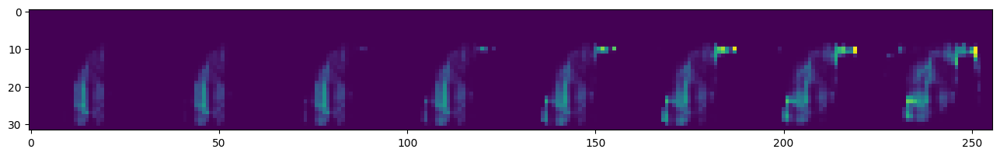

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 139/200] [loss: -422605.1300]


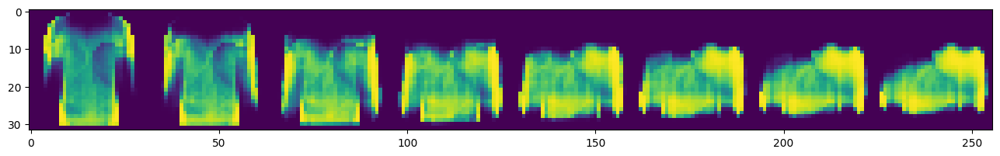

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 140/200] [loss: -422819.3776]


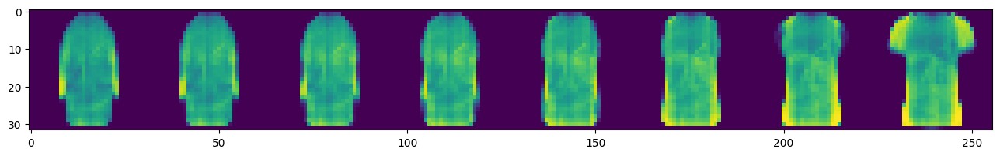

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 141/200] [loss: -422996.7655]


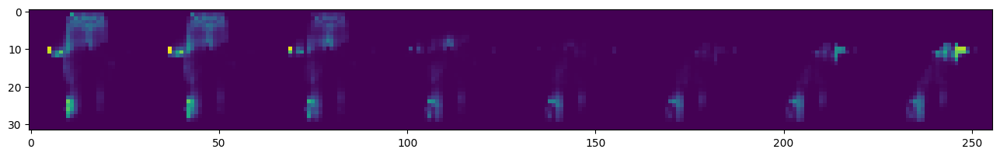

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 142/200] [loss: -422970.4130]


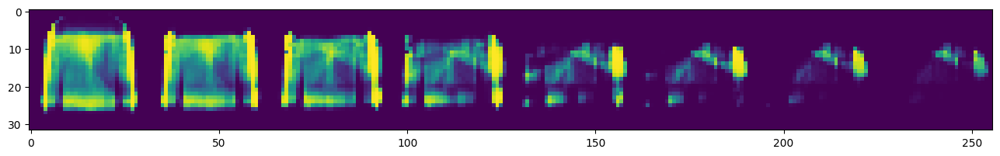

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 143/200] [loss: -423027.5891]


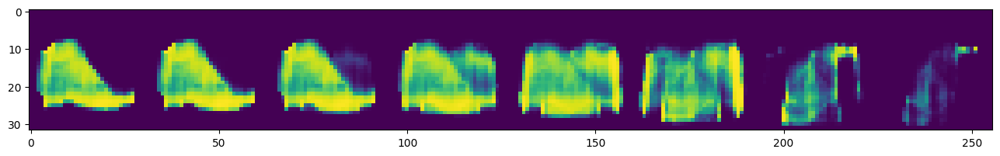

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 144/200] [loss: -422994.1071]


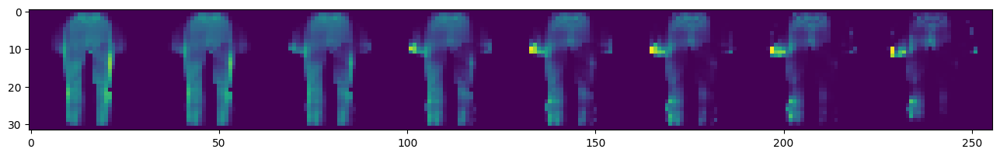

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 145/200] [loss: -423158.3175]


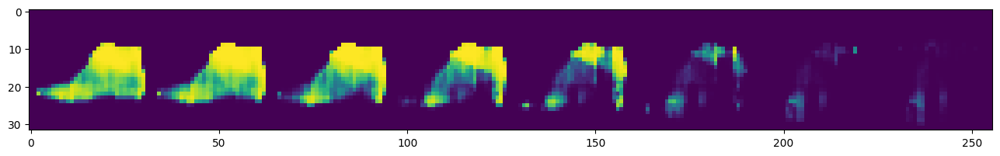

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 146/200] [loss: -423147.6442]


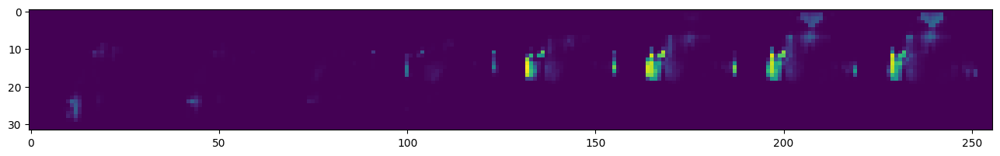

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 147/200] [loss: -423428.5177]


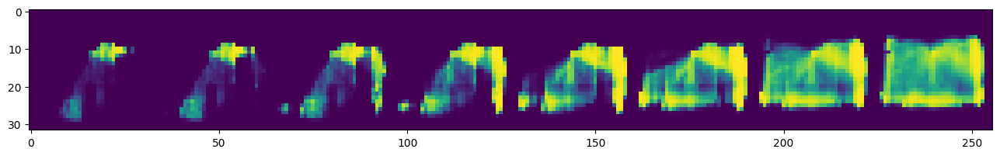

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 148/200] [loss: -423425.8151]


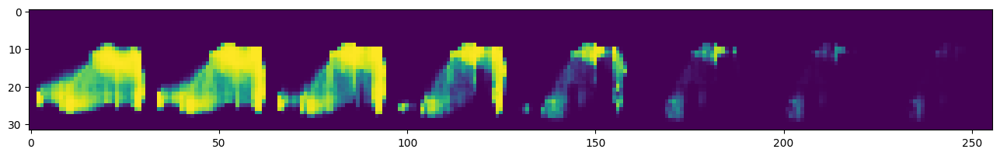

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 149/200] [loss: -423559.4370]


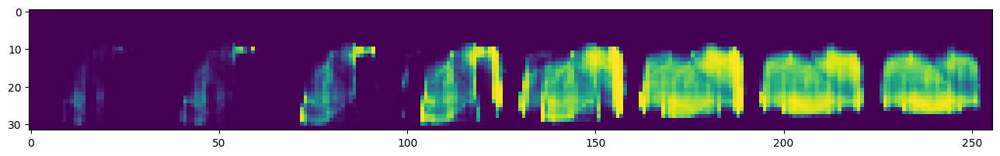

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 150/200] [loss: -423550.5707]


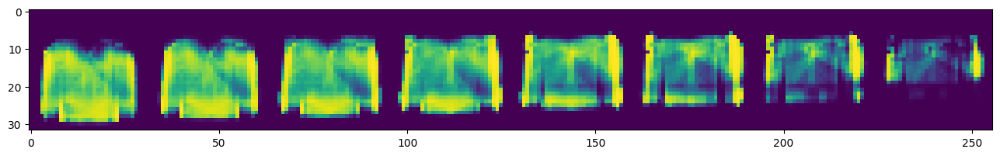

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 151/200] [loss: -423732.9807]


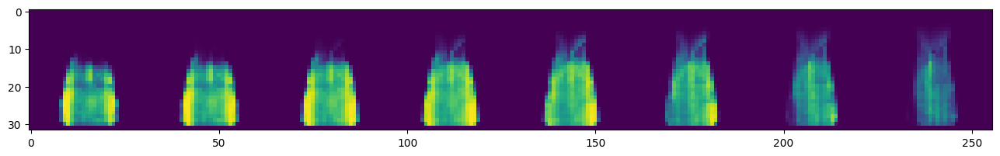

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 152/200] [loss: -423862.9378]


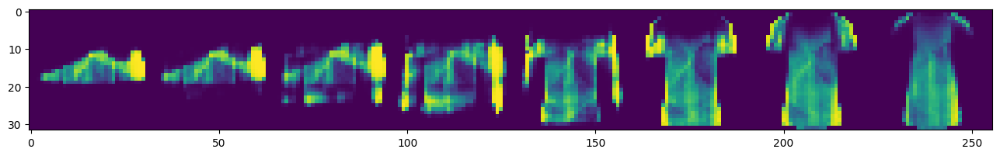

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 153/200] [loss: -423943.0704]


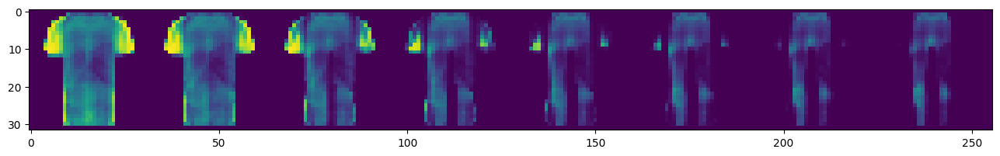

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 154/200] [loss: -423924.0250]


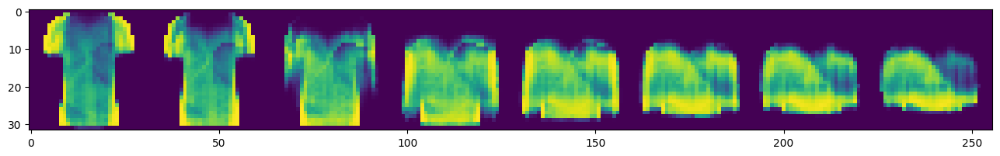

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 155/200] [loss: -423976.4284]


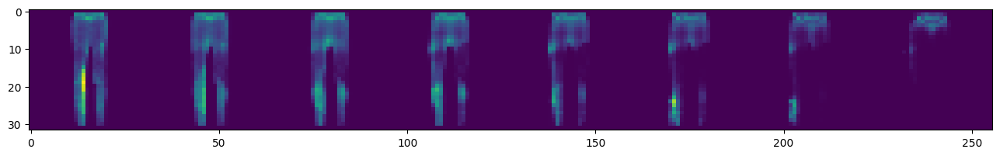

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 156/200] [loss: -424284.3345]


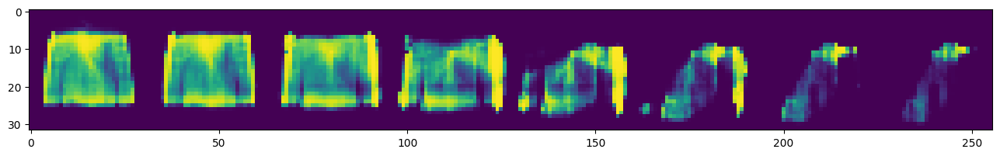

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 157/200] [loss: -424300.7306]


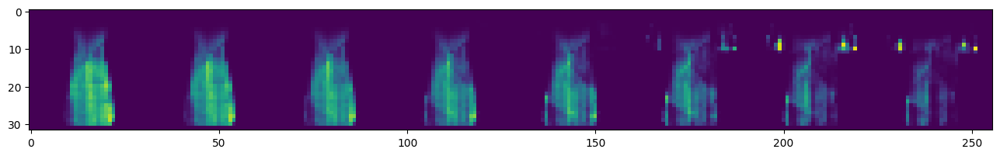

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 158/200] [loss: -424325.3692]


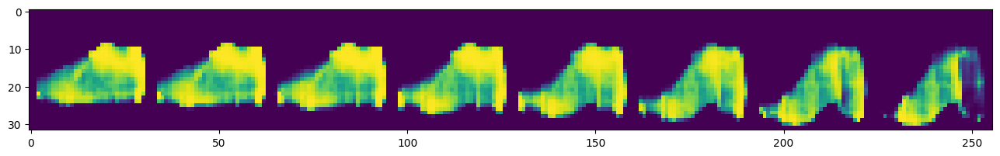

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 159/200] [loss: -424235.6751]


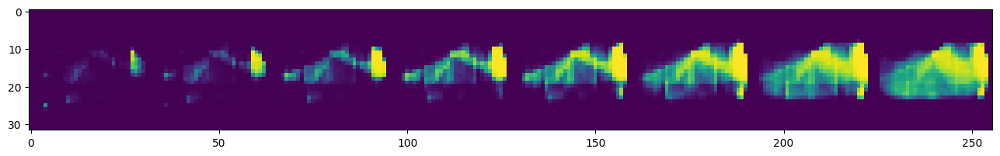

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 160/200] [loss: -424235.3344]


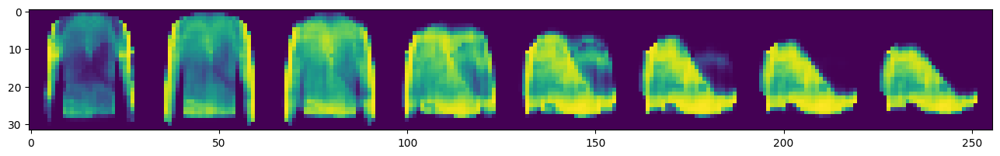

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 161/200] [loss: -424355.2968]


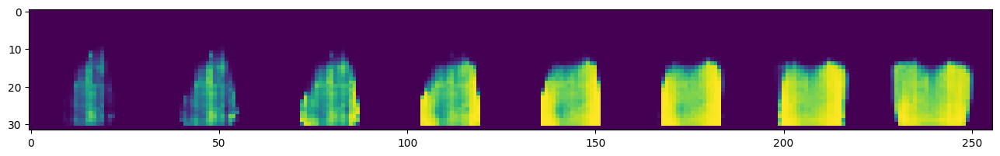

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 162/200] [loss: -424682.1064]


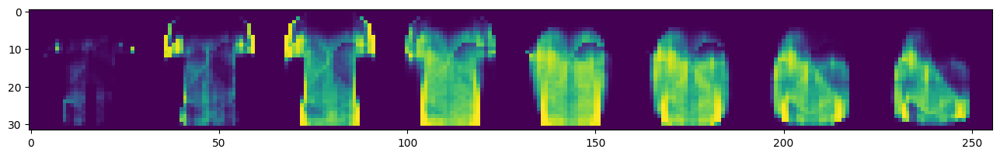

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 163/200] [loss: -424683.7289]


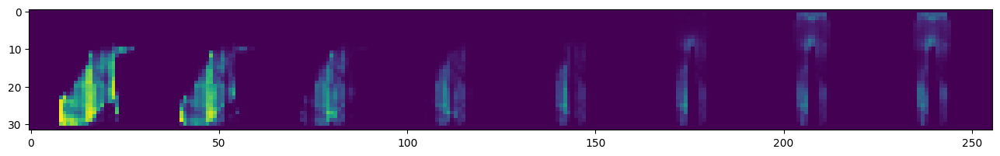

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 164/200] [loss: -424706.4201]


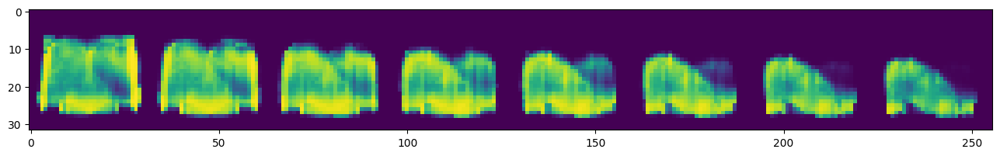

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 165/200] [loss: -424857.8080]


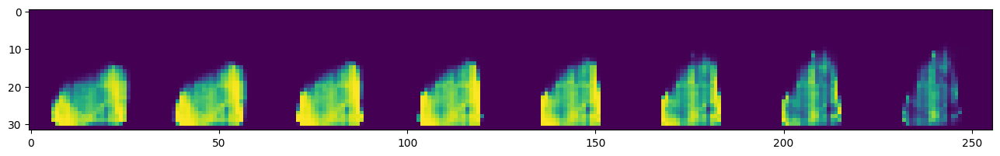

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 166/200] [loss: -424745.5918]


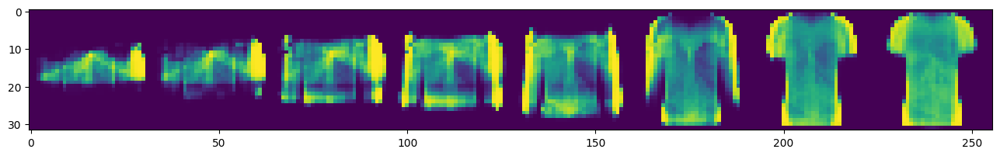

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 167/200] [loss: -424819.9167]


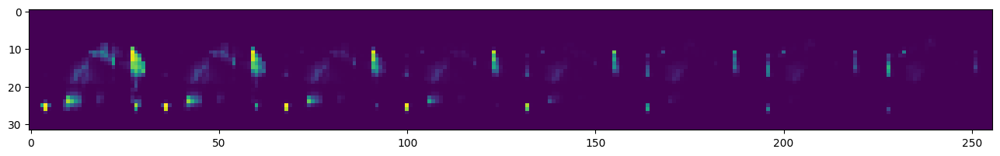

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 168/200] [loss: -425147.0357]


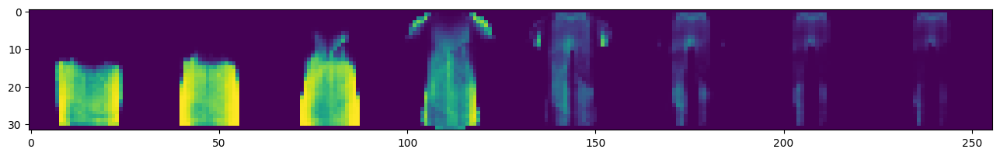

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 169/200] [loss: -425003.0234]


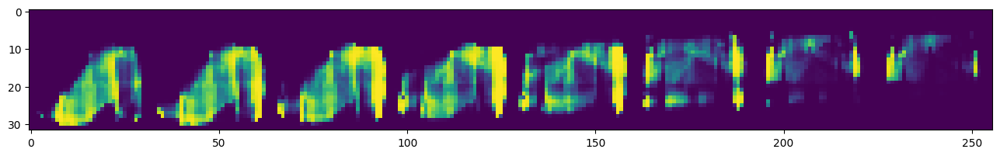

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 170/200] [loss: -425104.7638]


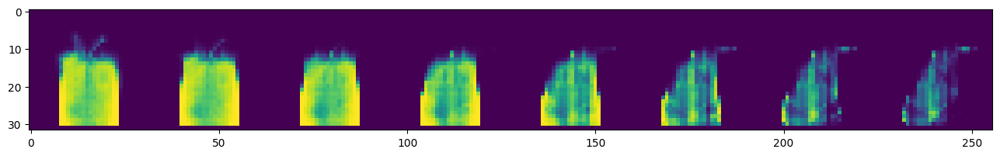

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 171/200] [loss: -425176.5928]


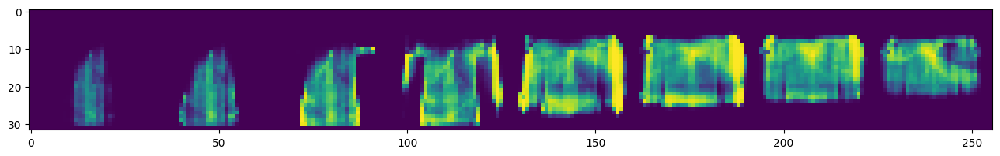

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 172/200] [loss: -425253.7120]


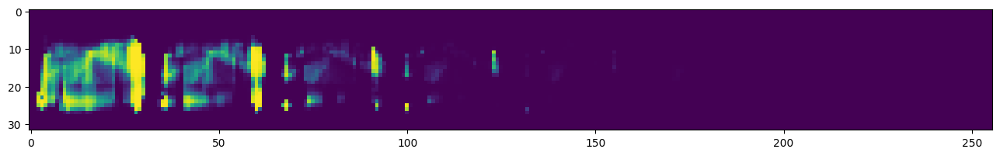

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 173/200] [loss: -425364.7945]


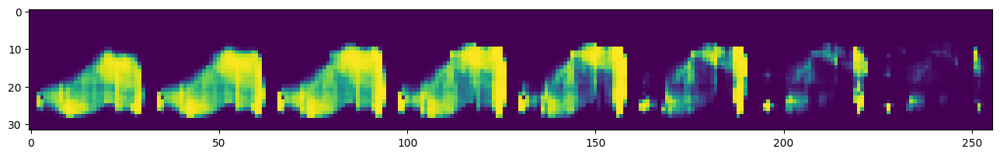

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 174/200] [loss: -425165.8742]


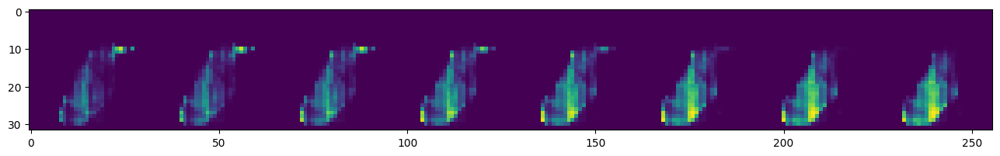

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 175/200] [loss: -425291.9594]


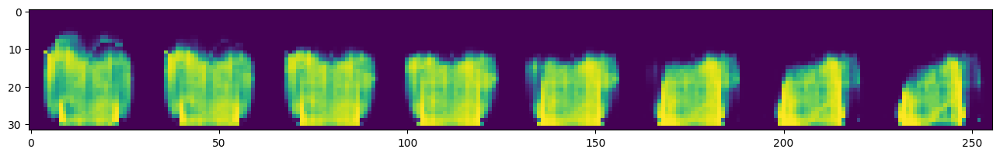

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 176/200] [loss: -425431.1790]


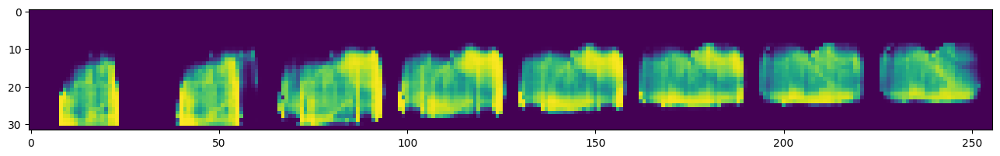

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 177/200] [loss: -425558.5646]


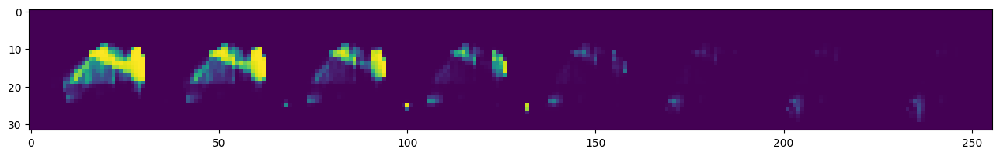

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 178/200] [loss: -425505.0021]


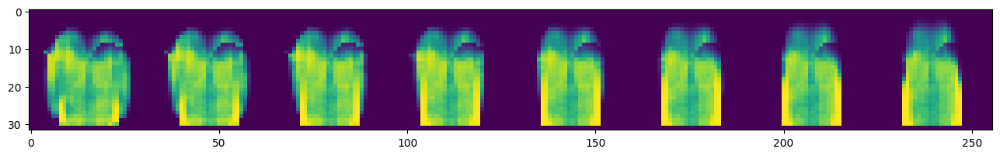

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 179/200] [loss: -425541.1904]


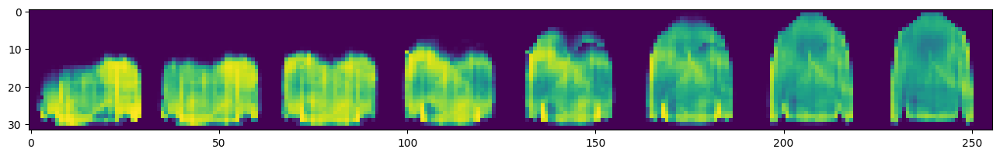

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 180/200] [loss: -425683.3892]


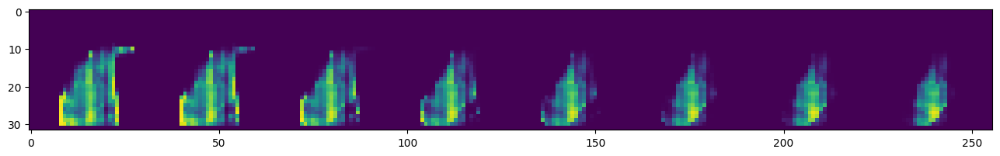

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 181/200] [loss: -425764.1107]


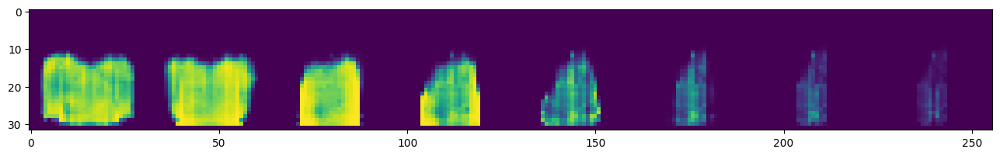

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 182/200] [loss: -425920.8455]


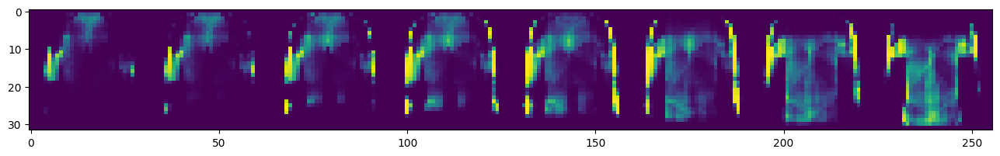

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 183/200] [loss: -425887.3367]


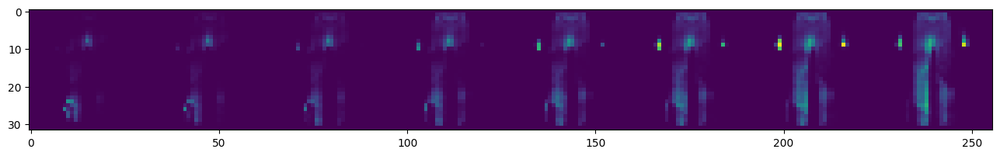

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 184/200] [loss: -426043.3866]


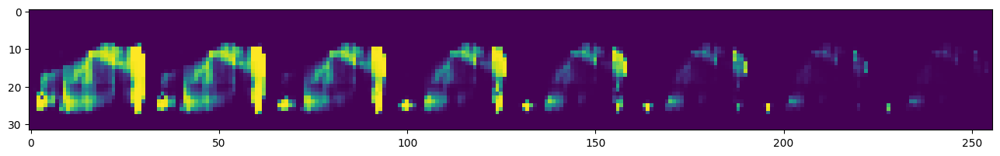

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 185/200] [loss: -425881.4401]


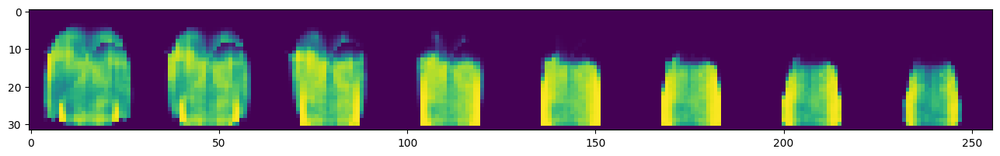

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 186/200] [loss: -425885.7135]


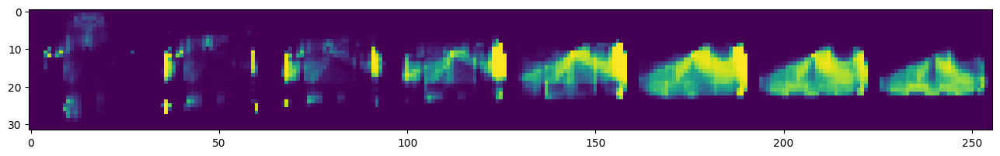

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 187/200] [loss: -426064.9106]


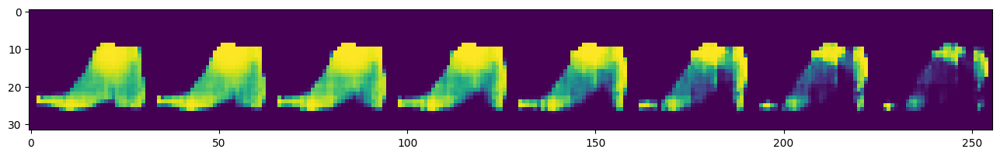

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 188/200] [loss: -426093.8775]


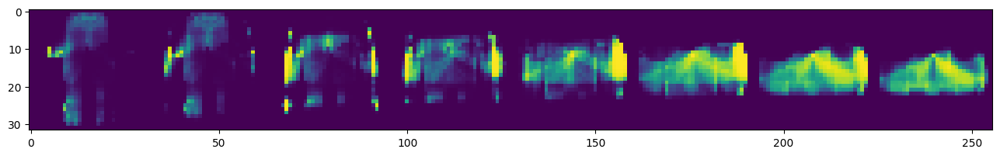

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 189/200] [loss: -426237.3715]


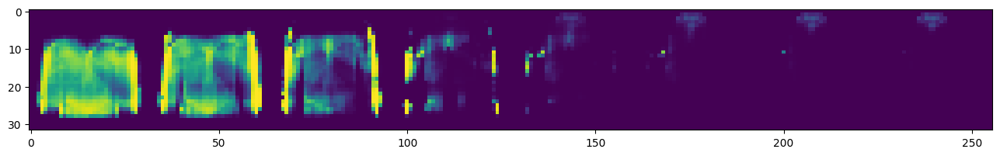

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 190/200] [loss: -426247.4048]


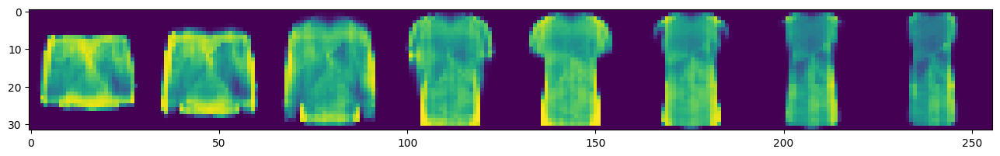

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 191/200] [loss: -426292.6042]


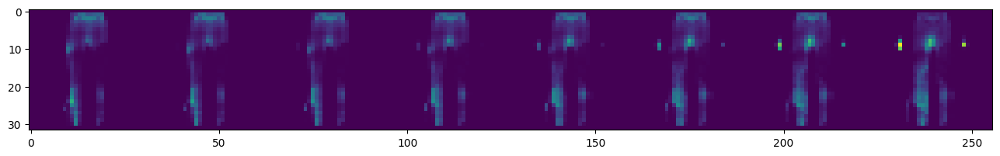

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 192/200] [loss: -426488.6336]


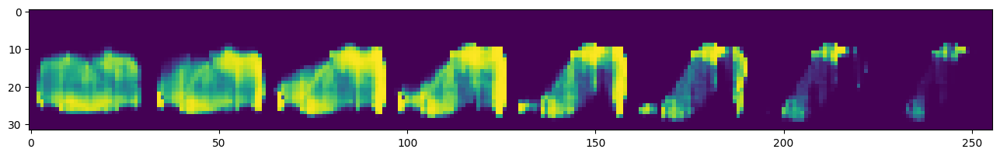

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 193/200] [loss: -426485.1669]


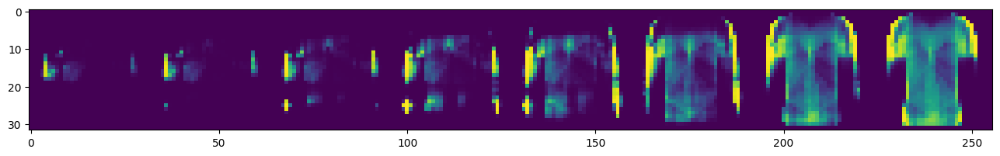

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 194/200] [loss: -426443.8977]


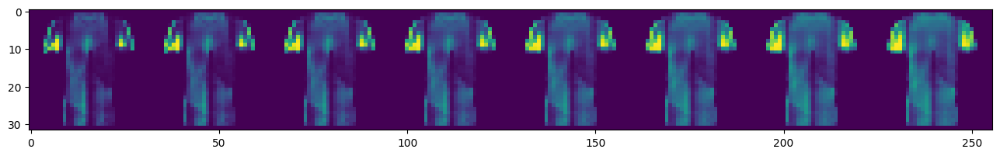

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 195/200] [loss: -426533.6461]


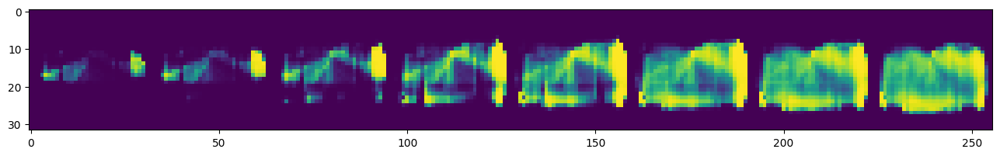

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 196/200] [loss: -426539.9561]


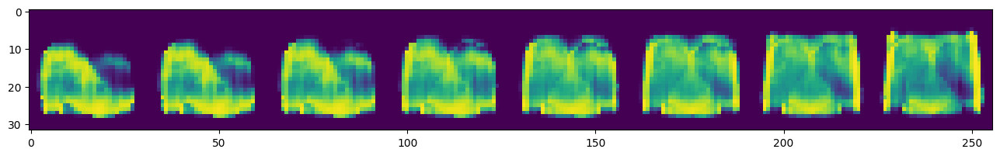

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 197/200] [loss: -426620.2739]


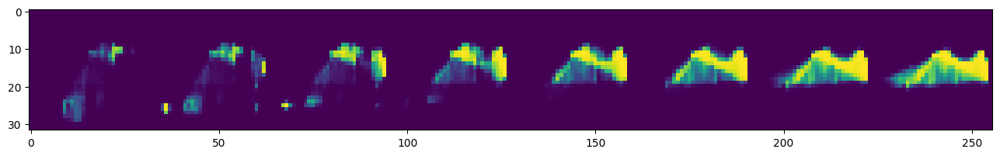

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 198/200] [loss: -426678.4862]


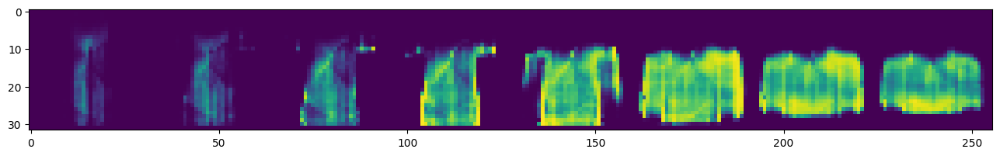

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 199/200] [loss: -426783.4779]


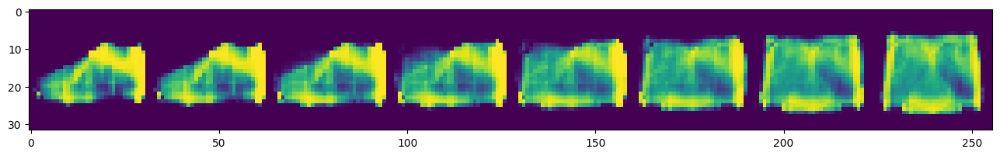

  0%|          | 0/7500 [00:00<?, ?it/s]

[Epoch: 200/200] [loss: -426944.6311]


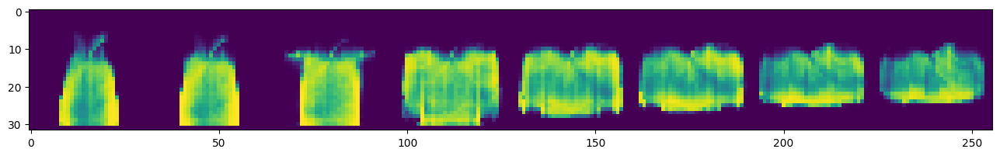

In [ ]:
vae = VAEManager(3) # You can pass your arguments to the call.
vae_history = vae.train(dataloader)

## GAN (39 + 15 points)

GAN's architecture consists of a Discriminator and a Generator. The Discriminator identifies whether an input image ($x$) is real or generated by the Generator. The Generator tries to create fake images given a random noise ($z$) such that the Discriminator can not distinguish them from the real images. These functionalities give rise to an adversarial situation where these networks can be seen as players. Thus, the standard loss for GAN is the following min-max loss. The Generator tries to minimize it, while the Discriminator tries to maximize it.

$$ \min_{\theta_g} \max_{\theta_d} E_{x \sim p_{data}}[log(D_{\theta_d}(x)] + E_{z \sim p(z)}[log(1 - D_{\theta_d}(G_{\theta_g}(z)))] $$

We try to optimize this loss function by alternating between the following objectives for the Discriminator and the Generator:
+ Discriminator's objective:
 $$ \max_{\theta_d} E_{x \sim p_{data}}[log(D_{\theta_d}(x)] + E_{z \sim p(z)}[log(1 - D_{\theta_d}(G_{\theta_g}(z)))] $$
+ Generator's objective:
$$ \min_{\theta_g} E_{z \sim p(z)}[log(1 - D_{\theta_d}(G_{\theta_g}(z)))] $$

Each player’s cost depends on the parameters of the other player. However, each
player can only optimize its own parameters.

### ❓ **Question 2**
*(8 points)*
> What are the challenges in this optimization process? How do they address each of these challenges?

#### **solution**:

There are several challenges in the optimization process of GANs:

1. **mode colapse** : When a generator produces a restricted range of samples and focus only a few modes of the actual data distribution, it results in mode collapse. In this case, the generator fails to capture the full diversity of the data. The likelihood of this occurring increases when the generator discovers a sample that can effortlessly fool the discriminator, and keeps generating similar samples.

2. **Vanishing gradients**: When the discriminator becomes too good at distinguishing real and fake samples. The reason for this is that the generator's loss function depends on the discriminator's output, and if the discriminator becomes confident in its predictions, then the generator will obtain minimal gradient updates that will ultimately stall its progress.

3. **Convergence and stability**: training GANs can be tough because of how the two networks compete with each other. It's like they're always trying to outperform each other, which can lead to oscillations and instability in the training process. Making sure everything works well and stays stable is a pretty big challenge!

4. **Hyperparameter tuning**: GANs are sensitive to hyperparameter choices, such as learning rates, batch sizes, and network architectures. Finding the right combination of hyperparameters can be time-consuming and requires extensive experimentation.

To address these challenges, several techniques and modifications have been proposed:

1. For mode collapse, techniques like minibatch discrimination, unrolled GANs, and Wasserstein GANs have been proposed to encourage the generator to produce diverse samples.

2. To tackle vanishing gradients, alternative loss functions have been proposed, such as the least-squares GAN (LSGAN) and the Wasserstein GAN (WGAN), which provide more meaningful gradient updates for the generator.

3. For convergence and stability, techniques like gradient penalty, spectral normalization, and layer normalization can be used to regularize and stabilize the training process.

4. To ease hyperparameter tuning, researchers have proposed guidelines and best practices based on empirical observations, such as using the Adam optimizer with specific learning rates and betas, using batch normalization, and employing specific activation functions like Leaky ReLU.

Despite these advancements, GAN training remains an active area of research, and new techniques continue to be developed to address the challenges in the optimization process.

In [3]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super(Generator, self).__init__()
        hid_dim = (z_dim * 5 + img_dim * 5) // 10

        ##########################################################
        # TODO (2 points): 
        # Define the generator model here. You may use linear layers, 
        # normalization layers, and activation layers.  
        ##########################################################
        
        self.model = nn.Sequential(
            nn.Linear(z_dim, hid_dim),
            nn.BatchNorm1d(hid_dim),
            nn.LeakyReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.BatchNorm1d(hid_dim),
            nn.LeakyReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.BatchNorm1d(hid_dim),
            nn.LeakyReLU(),
            nn.Linear(hid_dim, img_dim),
            nn.Tanh()
        )

    def forward(self, z): 

        img = None

        ##########################################################
        # TODO (2 points): 
        # Generate images from the random noise `z`.
        ##########################################################
        img = self.model(z)

        return img

class Discriminator(nn.Module):
    def __init__(self, img_dim, hid_dim):
        super(Discriminator, self).__init__()
        
        ##########################################################
        # TODO (2 points): 
        # Define the Discriminator model here. You may use linear 
        # layers, normalization layers, and activation layers.  
        ##########################################################
        self.model = nn.Sequential(
            nn.Linear(img_dim, hid_dim),
            nn.BatchNorm1d(hid_dim),
            nn.LeakyReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.LeakyReLU(),
            nn.Linear(hid_dim, 1),
            nn.Sigmoid()
        )
    def forward(self, img):

        real_or_fake = None

        ##########################################################
        # TODO (2 points): 
        # Predict whether each image in `img` is real or fake.
        ##########################################################
        img = img.view(img.shape[0], -1)
        real_or_fake = self.model(img)
        return real_or_fake

class GANManager():
    def __init__(self, z_dim, img_dim, hid_dim):
        
        ##########################################################
        # TODO (3 points): 
        # 1) Instantiate the Generator and the Discriminator.
        # 2) Define your optimizer(s). You can use Adam.
        ##########################################################

        self.generator = Generator(z_dim, img_dim).to(DEVICE)
        self.discriminator = Discriminator(img_dim, hid_dim).to(DEVICE)

        self.optimizer_G = torch.optim.Adam(self.generator.parameters(), lr= LR)
        self.optimizer_D = torch.optim.Adam(self.discriminator.parameters(), lr= LR)

        self.loss = nn.BCELoss()

    def train(self, dataloader, latent_size, **kwargs):

        history = dict(g_loss=[], d_loss=[])
        for epoch in range(EPOCHS):
            total_g_loss = []
            total_d_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)
                batch_size = batch_x.shape[0]
                ##########################################################
                # TODO (15 points): 
                # Calculate the loss for the Generator and the Discriminator.
                # Perform the optimization on `batch_x`.
                ##########################################################


                ###############################  discriminator train
                real_labels = torch.ones(batch_size, 1).to(DEVICE)
                fake_labels = torch.zeros(batch_size, 1).to(DEVICE)

                real_outputs = self.discriminator(batch_x)
                disc_loss_real = self.loss(real_outputs, real_labels)
                real_score = real_outputs

                noise = torch.randn(batch_size, latent_size).to(DEVICE)
                generated_images = self.generator(noise)
                fake_outputs = self.discriminator(generated_images)
                disc_loss_fake = self.loss(fake_outputs, fake_labels)
                fake_score = fake_outputs

                disc_loss = disc_loss_real + disc_loss_fake

                self.optimizer_D.zero_grad()
                disc_loss.backward()
                self.optimizer_D.step()

                ############################### generator train
                
                noise = torch.randn(batch_size, latent_size).to(DEVICE)
                generated_images = self.generator(noise)
                target_labels = torch.ones(batch_size, 1).to(DEVICE)
                gen_loss = self.loss(self.discriminator(generated_images), target_labels)

                self.optimizer_G.zero_grad()
                gen_loss.backward()
                self.optimizer_G.step()

                ###############################

                generator_loss = gen_loss
                discriminator_loss = disc_loss
                
                total_g_loss.append(generator_loss.item())
                total_d_loss.append(discriminator_loss.item())


            mean_d_loss = np.mean(total_d_loss)
            mean_g_loss = np.mean(total_g_loss)

            print(
                "[Epoch: %d/%d] [D loss: %.4f] [G loss: %.4f]"
                % (epoch+1, EPOCHS, mean_d_loss, mean_g_loss)
            )
            
            if epoch % 10 == 0 : 
              self.sample(8,  latent_size,plot=True)

            history['d_loss'].append(mean_d_loss)
            history['g_loss'].append(mean_g_loss)

        return history

    def sample(self, n,  latent_size,plot=True):

        ##########################################################
        # TODO (1 points): 
        # First, assign proper Gaussian noises to `z`.
        # Then, use can see that by using the Generator, we can
        # make new images and plot them.
        ##########################################################

        z = torch.randn(n, latent_size).to(DEVICE) 
        with torch.no_grad():
            gen_imgs = torch.cat([self.generator(z).view(-1,C_IN,IMG_SIZE,IMG_SIZE)], dim=0).detach()
            if plot:
                plot_images(gen_imgs)
            return gen_imgs

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 1/100] [D loss: 0.2355] [G loss: 4.1604]


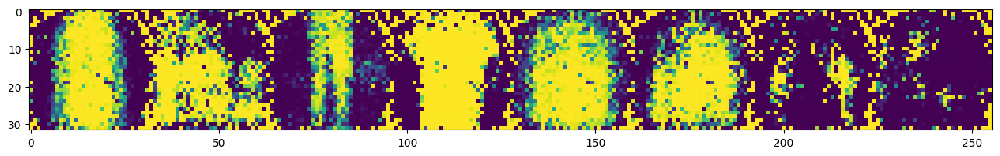

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 2/100] [D loss: 0.5012] [G loss: 3.3190]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 3/100] [D loss: 0.6538] [G loss: 2.5645]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 4/100] [D loss: 0.7491] [G loss: 2.2087]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 5/100] [D loss: 0.8281] [G loss: 1.9309]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 6/100] [D loss: 0.8605] [G loss: 1.8276]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 7/100] [D loss: 0.9083] [G loss: 1.7333]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 8/100] [D loss: 0.9688] [G loss: 1.5827]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 9/100] [D loss: 0.9773] [G loss: 1.5826]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 10/100] [D loss: 1.0452] [G loss: 1.4358]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 11/100] [D loss: 1.0351] [G loss: 1.4420]


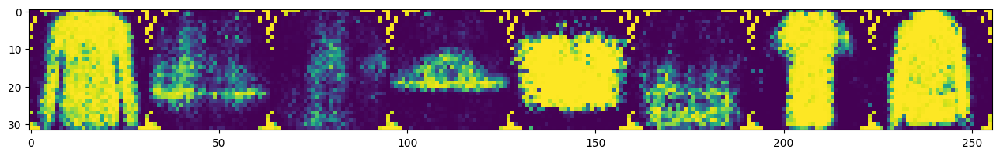

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 12/100] [D loss: 1.0648] [G loss: 1.3646]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 13/100] [D loss: 1.0856] [G loss: 1.3387]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 14/100] [D loss: 1.1303] [G loss: 1.2450]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 15/100] [D loss: 1.1234] [G loss: 1.2361]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 16/100] [D loss: 1.1298] [G loss: 1.2429]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 17/100] [D loss: 1.1206] [G loss: 1.2473]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 18/100] [D loss: 1.0742] [G loss: 1.3106]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 19/100] [D loss: 1.0474] [G loss: 1.3853]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 20/100] [D loss: 1.0122] [G loss: 1.4502]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 21/100] [D loss: 0.9947] [G loss: 1.4768]


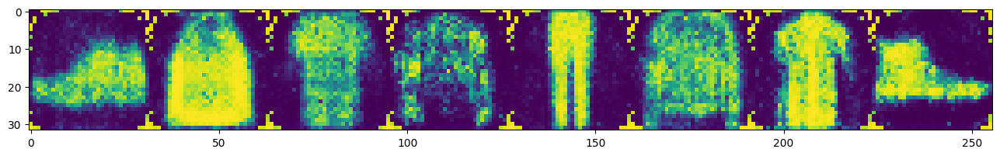

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 22/100] [D loss: 0.9323] [G loss: 1.6160]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 23/100] [D loss: 0.8892] [G loss: 1.7262]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 24/100] [D loss: 0.8623] [G loss: 1.7995]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 25/100] [D loss: 0.8449] [G loss: 1.8545]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 26/100] [D loss: 0.8171] [G loss: 1.9310]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 27/100] [D loss: 0.8323] [G loss: 1.9252]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 28/100] [D loss: 0.7888] [G loss: 2.0264]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 29/100] [D loss: 0.7572] [G loss: 2.1210]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 30/100] [D loss: 0.7229] [G loss: 2.2491]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 31/100] [D loss: 0.7238] [G loss: 2.2709]


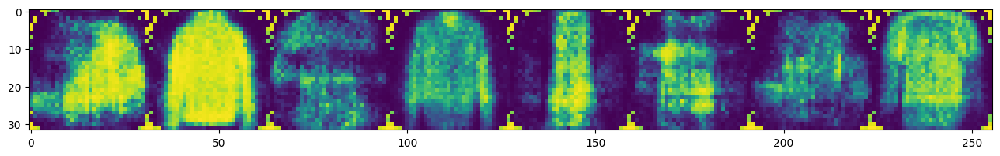

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 32/100] [D loss: 0.7215] [G loss: 2.3095]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 33/100] [D loss: 0.6926] [G loss: 2.3847]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 34/100] [D loss: 0.6890] [G loss: 2.4297]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 35/100] [D loss: 0.6696] [G loss: 2.4996]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 36/100] [D loss: 0.6566] [G loss: 2.5716]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 37/100] [D loss: 0.6455] [G loss: 2.6418]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 38/100] [D loss: 0.6408] [G loss: 2.6717]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 39/100] [D loss: 0.6206] [G loss: 2.7534]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 40/100] [D loss: 0.6039] [G loss: 2.7780]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 41/100] [D loss: 0.6022] [G loss: 2.8535]


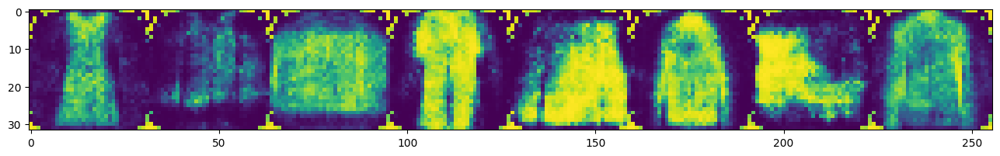

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 42/100] [D loss: 0.6082] [G loss: 2.8202]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 43/100] [D loss: 0.5829] [G loss: 2.9610]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 44/100] [D loss: 0.5804] [G loss: 2.9666]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 45/100] [D loss: 0.5666] [G loss: 3.0178]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 46/100] [D loss: 0.5433] [G loss: 3.0898]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 47/100] [D loss: 0.5543] [G loss: 3.1018]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 48/100] [D loss: 0.5572] [G loss: 3.1520]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 49/100] [D loss: 0.5376] [G loss: 3.1886]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 50/100] [D loss: 0.5431] [G loss: 3.2105]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 51/100] [D loss: 0.5431] [G loss: 3.1965]


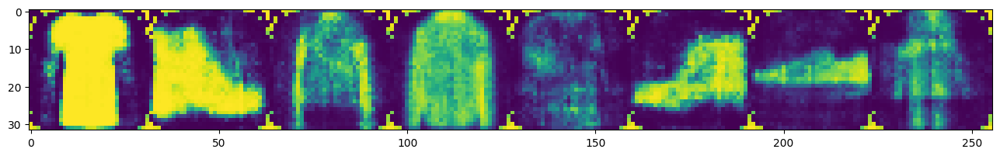

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 52/100] [D loss: 0.5244] [G loss: 3.3120]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 53/100] [D loss: 0.5048] [G loss: 3.4398]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 54/100] [D loss: 0.5084] [G loss: 3.4167]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 55/100] [D loss: 0.4899] [G loss: 3.4981]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 56/100] [D loss: 0.4864] [G loss: 3.5272]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 57/100] [D loss: 0.4959] [G loss: 3.5078]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 58/100] [D loss: 0.4921] [G loss: 3.5502]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 59/100] [D loss: 0.4772] [G loss: 3.6745]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 60/100] [D loss: 0.4886] [G loss: 3.6078]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 61/100] [D loss: 0.4565] [G loss: 3.7836]


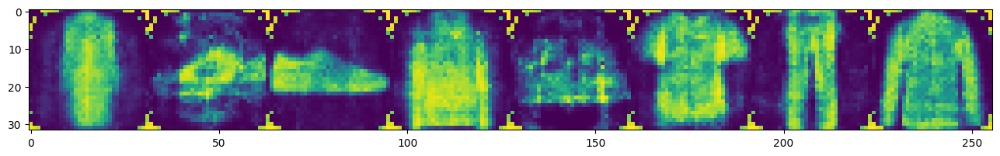

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 62/100] [D loss: 0.4675] [G loss: 3.7780]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 63/100] [D loss: 0.4532] [G loss: 3.8391]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 64/100] [D loss: 0.4544] [G loss: 3.8443]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 65/100] [D loss: 0.4288] [G loss: 4.0145]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 66/100] [D loss: 0.4372] [G loss: 3.9908]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 67/100] [D loss: 0.4365] [G loss: 3.9533]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 68/100] [D loss: 0.4387] [G loss: 4.0387]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 69/100] [D loss: 0.4331] [G loss: 4.0468]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 70/100] [D loss: 0.4294] [G loss: 4.1065]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 71/100] [D loss: 0.4202] [G loss: 4.1994]


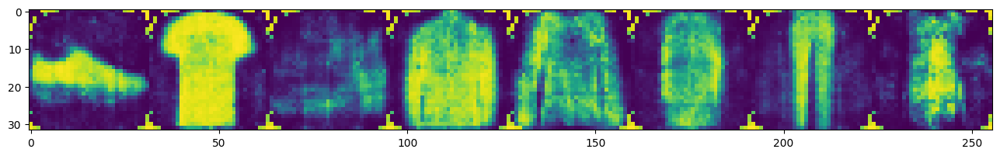

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 72/100] [D loss: 0.4114] [G loss: 4.2159]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 73/100] [D loss: 0.3932] [G loss: 4.2826]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 74/100] [D loss: 0.4141] [G loss: 4.2580]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 75/100] [D loss: 0.4074] [G loss: 4.2773]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 76/100] [D loss: 0.4094] [G loss: 4.3121]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 77/100] [D loss: 0.4107] [G loss: 4.3009]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 78/100] [D loss: 0.3932] [G loss: 4.4129]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 79/100] [D loss: 0.3931] [G loss: 4.4599]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 80/100] [D loss: 0.3913] [G loss: 4.4826]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 81/100] [D loss: 0.4073] [G loss: 4.3557]


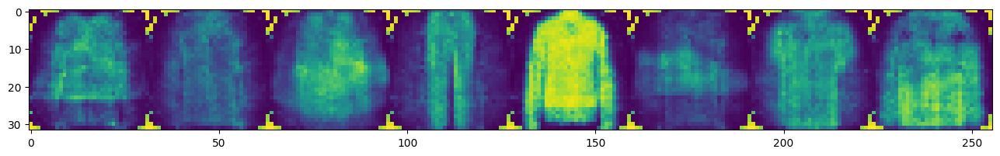

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 82/100] [D loss: 0.3917] [G loss: 4.4861]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 83/100] [D loss: 0.3951] [G loss: 4.4508]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 84/100] [D loss: 0.3915] [G loss: 4.5003]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 85/100] [D loss: 0.3834] [G loss: 4.6250]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 86/100] [D loss: 0.3875] [G loss: 4.5401]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 87/100] [D loss: 0.3862] [G loss: 4.5499]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 88/100] [D loss: 0.3896] [G loss: 4.4991]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 89/100] [D loss: 0.3643] [G loss: 4.7582]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 90/100] [D loss: 0.3591] [G loss: 4.7736]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 91/100] [D loss: 0.3800] [G loss: 4.7398]


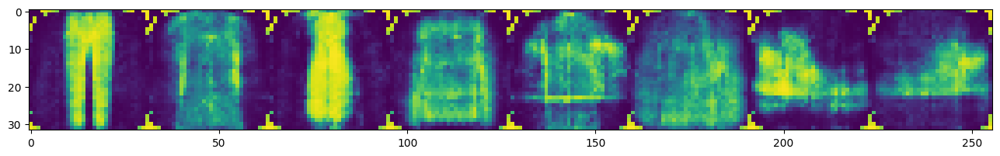

  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 92/100] [D loss: 0.3858] [G loss: 4.6591]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 93/100] [D loss: 0.3745] [G loss: 4.6994]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 94/100] [D loss: 0.3695] [G loss: 4.8185]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 95/100] [D loss: 0.3628] [G loss: 4.8375]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 96/100] [D loss: 0.3735] [G loss: 4.8360]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 97/100] [D loss: 0.3769] [G loss: 4.7400]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 98/100] [D loss: 0.3766] [G loss: 4.7097]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 99/100] [D loss: 0.3632] [G loss: 4.8384]


  0%|          | 0/2142 [00:00<?, ?it/s]

[Epoch: 100/100] [D loss: 0.3527] [G loss: 4.9583]


In [4]:
gan = GANManager(z_dim=32, img_dim=C_IN*IMG_SIZE*IMG_SIZE, hid_dim=256) # You can pass your arguments to the call.
gan_history = gan.train(dataloader, latent_size=32) # BATCH_SIZE = 28

dictionary saved successfully to file


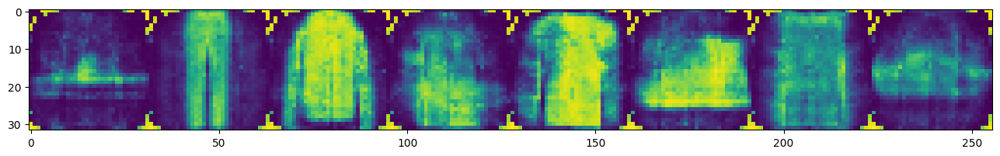

In [5]:
import pickle
torch.save(gan.generator.state_dict(), './gan_gen.pt')
torch.save(gan.discriminator.state_dict(), './gan_disc.pt')
with open('gan_hist.pkl', 'wb') as fp:
    pickle.dump(gan_history, fp)
    print('dictionary saved successfully to file')
# GAN trained on 100 epoch
_ = gan.sample(8,32)    

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/100] [D loss: 0.9396] [G loss: 1.2675]


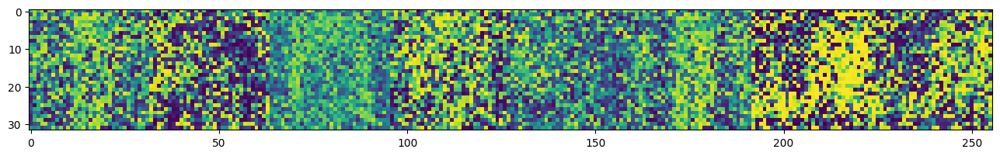

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/100] [D loss: 0.3273] [G loss: 2.7324]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/100] [D loss: 0.1530] [G loss: 3.7046]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/100] [D loss: 0.0990] [G loss: 4.5429]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/100] [D loss: 0.0599] [G loss: 5.0202]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/100] [D loss: 0.0363] [G loss: 5.5824]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/100] [D loss: 0.0351] [G loss: 5.8346]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/100] [D loss: 0.0351] [G loss: 6.0383]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/100] [D loss: 0.0367] [G loss: 6.0409]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/100] [D loss: 0.0415] [G loss: 6.1216]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/100] [D loss: 0.0374] [G loss: 6.1480]


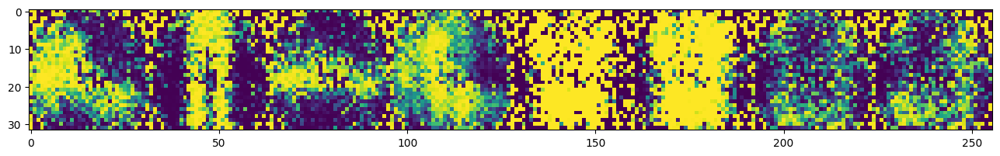

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/100] [D loss: 0.0372] [G loss: 6.2933]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/100] [D loss: 0.0372] [G loss: 6.2454]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/100] [D loss: 0.0442] [G loss: 6.4949]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/100] [D loss: 0.0417] [G loss: 6.4538]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/100] [D loss: 0.0392] [G loss: 6.5658]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/100] [D loss: 0.0440] [G loss: 7.0301]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/100] [D loss: 0.0330] [G loss: 7.5288]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/100] [D loss: 0.0287] [G loss: 7.1044]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/100] [D loss: 0.0378] [G loss: 7.3002]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/100] [D loss: 0.0334] [G loss: 6.8664]


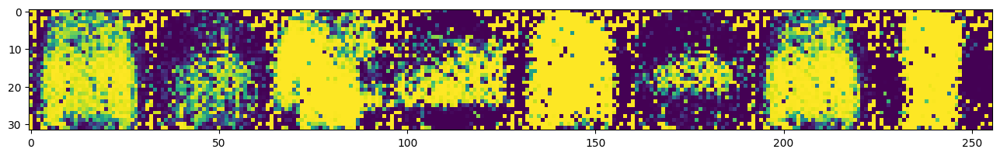

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/100] [D loss: 0.0400] [G loss: 7.0780]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/100] [D loss: 0.0414] [G loss: 6.8717]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/100] [D loss: 0.0458] [G loss: 6.9572]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/100] [D loss: 0.1231] [G loss: 7.4012]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/100] [D loss: 0.0514] [G loss: 7.0324]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/100] [D loss: 0.0492] [G loss: 7.1835]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/100] [D loss: 0.0471] [G loss: 6.9264]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/100] [D loss: 0.0477] [G loss: 7.1223]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/100] [D loss: 0.0686] [G loss: 7.7279]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/100] [D loss: 0.0682] [G loss: 6.8665]


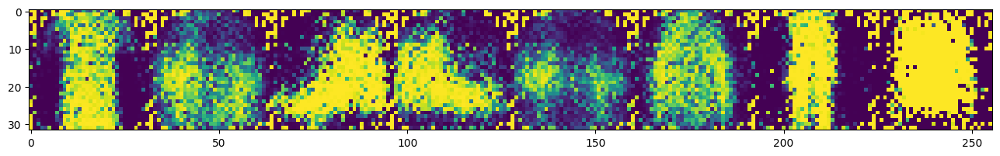

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/100] [D loss: 0.0682] [G loss: 6.8799]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/100] [D loss: 0.0766] [G loss: 7.1613]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/100] [D loss: 0.0873] [G loss: 7.2864]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/100] [D loss: 0.0930] [G loss: 7.3577]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/100] [D loss: 0.0838] [G loss: 7.8119]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/100] [D loss: 0.0961] [G loss: 6.8432]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/100] [D loss: 0.0887] [G loss: 6.5405]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/100] [D loss: 0.1070] [G loss: 7.4341]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/100] [D loss: 0.1594] [G loss: 6.6510]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 41/100] [D loss: 0.1600] [G loss: 6.0982]


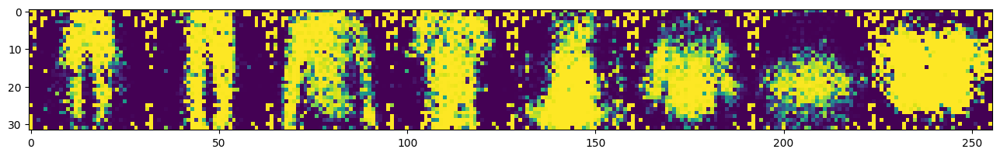

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 42/100] [D loss: 0.1343] [G loss: 6.8808]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 43/100] [D loss: 0.1204] [G loss: 7.1191]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 44/100] [D loss: 0.1334] [G loss: 6.8549]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 45/100] [D loss: 0.1288] [G loss: 6.7562]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 46/100] [D loss: 0.1576] [G loss: 6.8122]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 47/100] [D loss: 0.1742] [G loss: 5.9865]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 48/100] [D loss: 0.1578] [G loss: 6.4844]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 49/100] [D loss: 0.1582] [G loss: 6.4830]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 50/100] [D loss: 0.1361] [G loss: 6.6292]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 51/100] [D loss: 0.1429] [G loss: 6.8380]


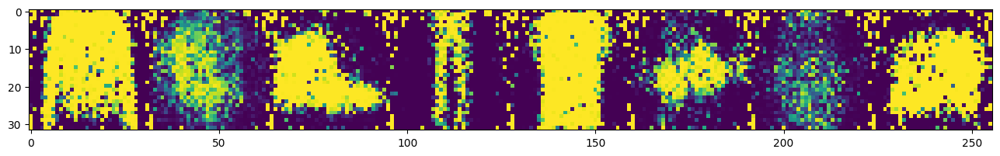

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 52/100] [D loss: 0.1799] [G loss: 7.1499]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 53/100] [D loss: 0.1605] [G loss: 7.1435]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 54/100] [D loss: 0.1688] [G loss: 6.2658]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 55/100] [D loss: 0.2254] [G loss: 5.7131]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 56/100] [D loss: 0.1954] [G loss: 6.1612]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 57/100] [D loss: 0.2120] [G loss: 6.8981]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 58/100] [D loss: 0.2218] [G loss: 6.6691]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 59/100] [D loss: 0.2398] [G loss: 5.7531]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 60/100] [D loss: 0.2653] [G loss: 5.8483]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 61/100] [D loss: 0.2812] [G loss: 5.3374]


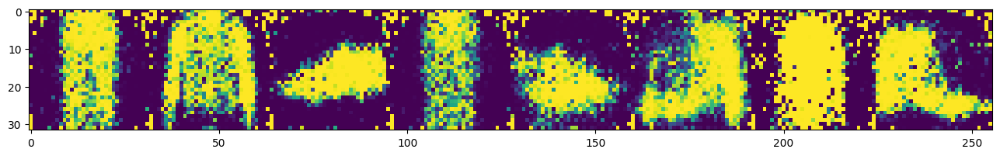

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 62/100] [D loss: 0.2942] [G loss: 5.6269]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 63/100] [D loss: 0.2558] [G loss: 5.1053]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 64/100] [D loss: 0.2447] [G loss: 5.6026]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 65/100] [D loss: 0.2822] [G loss: 5.4128]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 66/100] [D loss: 0.2558] [G loss: 5.4633]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 67/100] [D loss: 0.3206] [G loss: 4.8741]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 68/100] [D loss: 0.3025] [G loss: 4.8730]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 69/100] [D loss: 0.3094] [G loss: 5.1696]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 70/100] [D loss: 0.3628] [G loss: 5.1014]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 71/100] [D loss: 0.3429] [G loss: 4.8373]


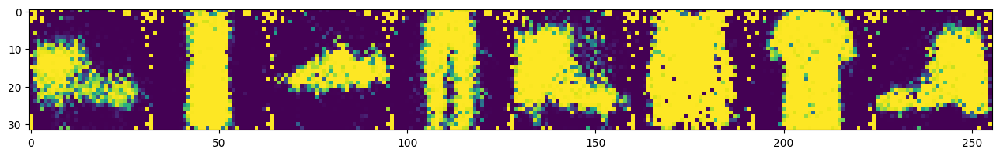

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 72/100] [D loss: 0.3583] [G loss: 5.0556]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 73/100] [D loss: 0.3567] [G loss: 4.4698]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 74/100] [D loss: 0.3807] [G loss: 4.7024]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 75/100] [D loss: 0.3934] [G loss: 4.5714]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 76/100] [D loss: 0.4027] [G loss: 4.4221]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 77/100] [D loss: 0.4714] [G loss: 4.0941]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 78/100] [D loss: 0.4120] [G loss: 4.4276]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 79/100] [D loss: 0.4848] [G loss: 3.7922]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 80/100] [D loss: 0.4069] [G loss: 3.8544]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 81/100] [D loss: 0.4375] [G loss: 4.2816]


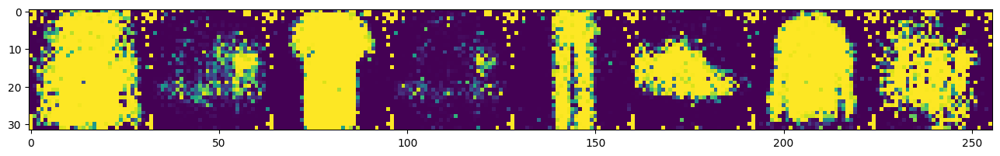

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 82/100] [D loss: 0.4388] [G loss: 4.2253]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 83/100] [D loss: 0.4372] [G loss: 4.1023]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 84/100] [D loss: 0.4827] [G loss: 4.0121]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 85/100] [D loss: 0.4778] [G loss: 3.5427]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 86/100] [D loss: 0.4387] [G loss: 3.8033]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 87/100] [D loss: 0.4709] [G loss: 3.9084]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 88/100] [D loss: 0.4956] [G loss: 3.5121]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 89/100] [D loss: 0.4775] [G loss: 3.4870]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 90/100] [D loss: 0.4551] [G loss: 3.6765]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 91/100] [D loss: 0.5499] [G loss: 3.4622]


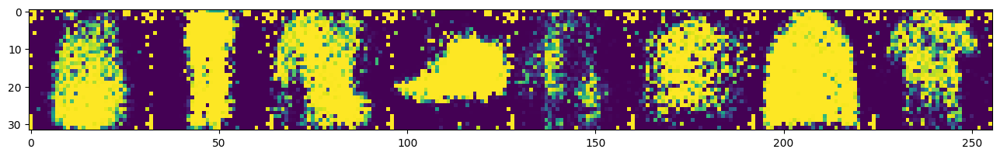

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 92/100] [D loss: 0.5679] [G loss: 3.2947]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 93/100] [D loss: 0.5434] [G loss: 3.6098]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 94/100] [D loss: 0.4974] [G loss: 3.4525]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 95/100] [D loss: 0.4787] [G loss: 3.4256]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 96/100] [D loss: 0.5642] [G loss: 3.4515]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 97/100] [D loss: 0.5923] [G loss: 3.5570]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 98/100] [D loss: 0.5715] [G loss: 3.4151]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 99/100] [D loss: 0.5700] [G loss: 3.3578]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 100/100] [D loss: 0.6184] [G loss: 3.0070]


In [23]:
gan1 = GANManager(z_dim=32, img_dim=C_IN*IMG_SIZE*IMG_SIZE, hid_dim=256) # You can pass your arguments to the call.
gan_history1 = gan1.train(dataloader, latent_size=32) # BATCH_SIZE = 1024

dictionary saved successfully to file


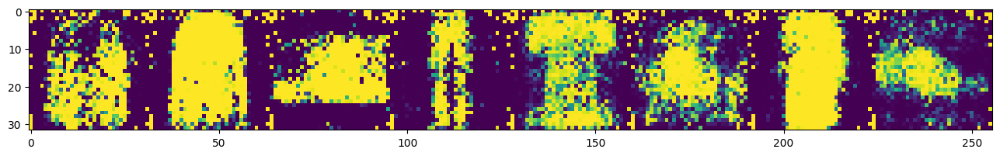

In [24]:
import pickle
torch.save(gan1.generator.state_dict(), './gan_gen1.pt')
torch.save(gan1.discriminator.state_dict(), './gan_disc1.pt')
with open('gan_hist1.pkl', 'wb') as fp:
    pickle.dump(gan_history1, fp)
    print('dictionary saved successfully to file')
# GAN trained on 100 epoch
_ = gan1.sample(8,32)

### ❓ **Question 3**
> - ** *(4 points)* How can we generate images from a specific class in GAN?**

To generate images from a specific class in a Generative Adversarial Network (GAN), you can use a Conditional GAN (cGAN). A cGAN is an extension of the traditional GAN architecture that allows you to generate images conditioned on class labels or other information. Here's a high-level overview of how to implement a cGAN:

1. Modify the generator and discriminator architectures:
   - Generator: Add an additional input for the class label. This can be done by concatenating the class label (usually in a one-hot encoded format) with the random noise vector. Alternatively, you can use an embedding layer to convert the class label into a dense vector and then concatenate it with the noise vector.
   - Discriminator: Add an additional input for the class label. Similar to the generator, concatenate the class label (one-hot encoded or embedded) with the input image. This allows the discriminator to consider both the image and the class label when making its decision.

2. Train the cGAN:
   - During training, provide both the real images and their corresponding class labels to the discriminator. The generator will receive random noise vectors and the desired class labels as inputs.
   - The generator tries to generate images that match the desired class labels, while the discriminator tries to distinguish between real images and generated images based on both the image and the class label.
   - Update the generator and discriminator weights using backpropagation and gradient descent (or other optimization algorithms).

3. Generate images from a specific class:
   - To generate images from a specific class, provide the generator with a random noise vector and the desired class label. The generator will produce an image conditioned on the given class label.



> ** *(Bonus - 15 points)* Implement your idea and plot 8 images from each of the 10 classes.**


Implementing CGAN in the following cell:

## CGAN:

In [43]:
class ModifiedGenerator(nn.Module):
    def __init__(self, z_dim, out_dim, n_classes):
        super(ModifiedGenerator, self).__init__()
        n = (z_dim + n_classes + out_dim) // 2

        self.n_classes = n_classes

        self.layers = nn.Sequential(
            nn.Linear(z_dim + n_classes, n),
            nn.BatchNorm1d(n),
            nn.LeakyReLU(),
            nn.Linear(n,n),
            nn.BatchNorm1d(n),
            nn.LeakyReLU(),
            nn.Linear(n,n),
            nn.BatchNorm1d(n),
            nn.LeakyReLU(),
            nn.Linear(n,out_dim),
            nn.Tanh()
        )

    def forward(self, z, label):
        embed = F.one_hot(label, self.n_classes).view(-1, self.n_classes)
        z = torch.cat((embed, z), 1)
        img = self.layers(z)
        return img


class ModifiedDiscriminator(nn.Module):
    def __init__(self, img_dim, hidden_size, n_classes):
        super(ModifiedDiscriminator, self).__init__()
        self.n_classes = n_classes

        self.layers = nn.Sequential(
            nn.Linear(img_dim + n_classes, hidden_size),
                nn.BatchNorm1d(hidden_size),
                nn.LeakyReLU(),
                nn.Linear(hidden_size, hidden_size),
                nn.BatchNorm1d(hidden_size),
                nn.LeakyReLU(),
                nn.Linear(hidden_size, 1),
                nn.Sigmoid()
        )

    def forward(self, img, label):
        img = img.view(img.shape[0], -1)
        embed = F.one_hot(label, self.n_classes).view(-1, self.n_classes)
        img = torch.cat((img, embed), 1)
        real_or_fake = self.layers(img)
        return real_or_fake


class ModifiedCGANTrainer:
    def __init__(self, z_dim, img_dim, hidden_size, n_classes):
        self.n_classes = n_classes
        self.cgenerator = ModifiedGenerator(z_dim, img_dim, n_classes).to(DEVICE)
        self.cdiscriminator = ModifiedDiscriminator(img_dim, hidden_size, n_classes).to(DEVICE)
        self.gen_optimizer = torch.optim.Adam(self.cgenerator.parameters(), lr=LR)
        self.dis_optimizer = torch.optim.Adam(self.cdiscriminator.parameters(), lr=LR)
        self.loss = nn.BCELoss()

    def train(self, dataloader, latent_size, **kwargs):

        history = dict(g_loss=[], d_loss=[])
        for epoch in range(EPOCHS):
            total_g_loss = []
            total_d_loss = []
            for i, (batch_x, batch_y) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)
                batch_y = batch_y.to(DEVICE)
                batch_size = batch_x.shape[0]

                real_labels = torch.ones(batch_size, 1).to(DEVICE)
                fake_labels = torch.zeros(batch_size, 1).to(DEVICE)
                outputs = self.cdiscriminator(batch_x, batch_y)
                d_loss_real = self.loss(outputs, real_labels)
                real_score = outputs
                z = torch.randn(batch_size, latent_size).to(DEVICE)
                z_labels = torch.randint(self.n_classes,(batch_size, 1)).to(DEVICE)
                fake_images = self.cgenerator(z,z_labels)
                outputs = self.cdiscriminator(fake_images,z_labels)
                d_loss_fake = self.loss(outputs, fake_labels)
                fake_score = outputs
                d_loss = d_loss_real + d_loss_fake
                self.dis_optimizer.zero_grad()
                d_loss.backward()
                self.dis_optimizer.step()
                
                
                
                z = torch.randn(batch_size, latent_size).to(DEVICE)
                z_labels = torch.randint(self.n_classes,(batch_size, 1)).to(DEVICE)
                fake_images = self.cgenerator(z, z_labels)
                labels = torch.ones(batch_size, 1).to(DEVICE)
                g_loss = self.loss(self.cdiscriminator(fake_images, z_labels), labels)
                self.gen_optimizer.zero_grad()
                g_loss.backward()
                self.gen_optimizer.step() 


                generator_loss = g_loss
                discriminator_loss = d_loss                
                total_g_loss.append(generator_loss.item())
                total_d_loss.append(discriminator_loss.item())

            mean_d_loss = np.mean(total_d_loss)
            mean_g_loss = np.mean(total_g_loss)
            print(
                "[Epoch: %d/%d] [D loss: %.4f] [G loss: %.4f]"
                % (epoch+1, EPOCHS, mean_d_loss, mean_g_loss)
            )
            if epoch % 10 == 0:
              self.sample(10, latent_size, plot=True)

            history['d_loss'].append(mean_d_loss)
            history['g_loss'].append(mean_g_loss)

        return history

    def sample(self, n, latent_size, plot=True):
      zs = torch.randn(n, latent_size).to(DEVICE) 
      z_labels = torch.tensor([[i] for i in range(self.n_classes)],dtype=int).to(DEVICE)
      with torch.no_grad():
            gen_imgs = torch.cat([self.cgenerator(zs, z_labels).view(-1,C_IN,IMG_SIZE,IMG_SIZE)], dim=0).detach()
            if plot:
                plot_images(gen_imgs)
            return gen_imgs


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/100] [D loss: 1.1047] [G loss: 0.8917]


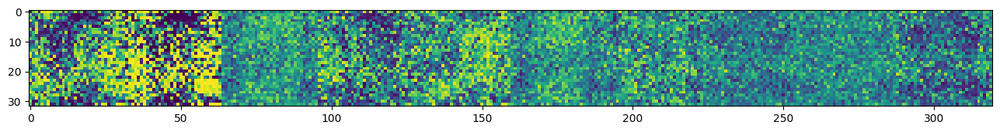

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/100] [D loss: 0.6584] [G loss: 1.4146]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/100] [D loss: 0.3664] [G loss: 1.9743]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/100] [D loss: 0.2258] [G loss: 2.4660]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/100] [D loss: 0.1458] [G loss: 2.9175]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/100] [D loss: 0.1393] [G loss: 3.1347]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/100] [D loss: 0.1038] [G loss: 3.4462]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/100] [D loss: 0.0692] [G loss: 3.7223]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/100] [D loss: 0.0646] [G loss: 3.8911]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/100] [D loss: 0.0632] [G loss: 4.0159]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/100] [D loss: 0.0579] [G loss: 4.2444]


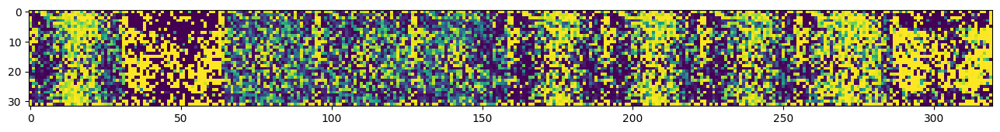

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/100] [D loss: 0.0471] [G loss: 4.3414]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/100] [D loss: 0.0412] [G loss: 4.6071]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/100] [D loss: 0.0343] [G loss: 4.6922]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/100] [D loss: 0.0266] [G loss: 4.7906]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/100] [D loss: 0.0258] [G loss: 4.8029]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/100] [D loss: 0.0232] [G loss: 4.9676]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/100] [D loss: 0.0257] [G loss: 5.4486]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/100] [D loss: 0.0210] [G loss: 5.4413]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/100] [D loss: 0.0204] [G loss: 5.3531]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/100] [D loss: 0.0232] [G loss: 5.4564]


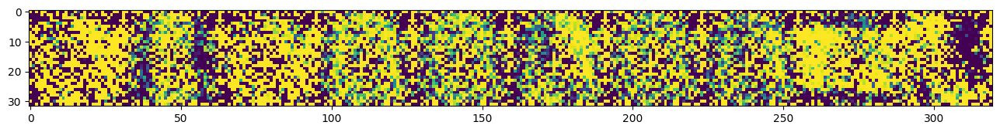

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/100] [D loss: 0.0201] [G loss: 5.3338]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/100] [D loss: 0.0201] [G loss: 5.8169]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/100] [D loss: 0.0223] [G loss: 5.8827]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/100] [D loss: 0.0259] [G loss: 5.8016]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/100] [D loss: 0.0251] [G loss: 5.6696]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/100] [D loss: 0.0337] [G loss: 5.6725]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/100] [D loss: 0.0354] [G loss: 5.4544]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/100] [D loss: 0.0369] [G loss: 5.2926]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/100] [D loss: 0.0468] [G loss: 5.4968]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/100] [D loss: 0.0544] [G loss: 5.3152]


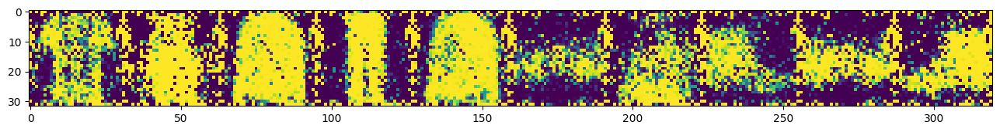

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/100] [D loss: 0.0583] [G loss: 5.3212]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/100] [D loss: 0.0736] [G loss: 5.2283]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/100] [D loss: 0.0720] [G loss: 5.1990]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/100] [D loss: 0.0766] [G loss: 4.9937]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/100] [D loss: 0.0893] [G loss: 5.0286]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/100] [D loss: 0.1305] [G loss: 4.9283]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/100] [D loss: 0.1161] [G loss: 4.6724]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/100] [D loss: 0.1142] [G loss: 4.6154]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/100] [D loss: 0.1160] [G loss: 4.8375]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 41/100] [D loss: 0.1121] [G loss: 4.8515]


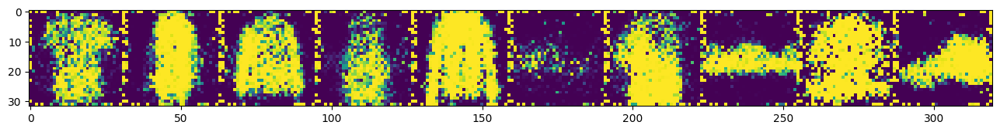

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 42/100] [D loss: 0.1129] [G loss: 4.5386]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 43/100] [D loss: 0.1126] [G loss: 4.5300]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 44/100] [D loss: 0.1060] [G loss: 4.6656]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 45/100] [D loss: 0.1292] [G loss: 4.4718]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 46/100] [D loss: 0.1119] [G loss: 4.7360]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 47/100] [D loss: 0.1259] [G loss: 4.4900]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 48/100] [D loss: 0.1214] [G loss: 4.7355]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 49/100] [D loss: 0.1598] [G loss: 4.6715]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 50/100] [D loss: 0.1573] [G loss: 4.5931]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 51/100] [D loss: 0.1715] [G loss: 4.3649]


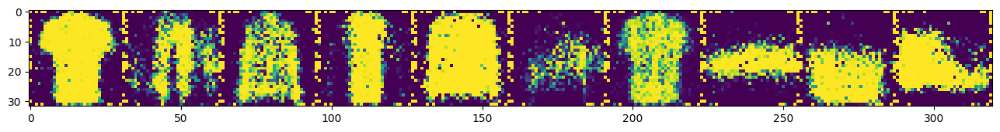

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 52/100] [D loss: 0.1551] [G loss: 4.5700]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 53/100] [D loss: 0.1663] [G loss: 4.6429]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 54/100] [D loss: 0.1751] [G loss: 4.4660]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 55/100] [D loss: 0.1724] [G loss: 4.3500]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 56/100] [D loss: 0.1667] [G loss: 4.3177]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 57/100] [D loss: 0.1780] [G loss: 4.1840]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 58/100] [D loss: 0.1972] [G loss: 4.1444]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 59/100] [D loss: 0.1923] [G loss: 4.2575]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 60/100] [D loss: 0.1901] [G loss: 4.1567]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 61/100] [D loss: 0.2067] [G loss: 4.0955]


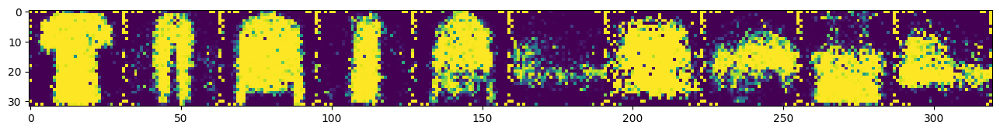

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 62/100] [D loss: 0.2008] [G loss: 4.1860]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 63/100] [D loss: 0.2248] [G loss: 4.0557]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 64/100] [D loss: 0.2219] [G loss: 3.9208]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 65/100] [D loss: 0.2278] [G loss: 3.8617]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 66/100] [D loss: 0.2285] [G loss: 3.9358]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 67/100] [D loss: 0.2474] [G loss: 3.9840]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 68/100] [D loss: 0.2480] [G loss: 3.8678]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 69/100] [D loss: 0.2497] [G loss: 3.7898]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 70/100] [D loss: 0.2353] [G loss: 3.8340]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 71/100] [D loss: 0.3005] [G loss: 3.8804]


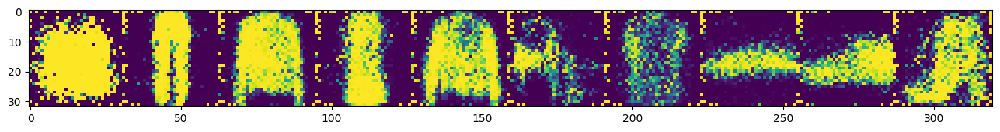

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 72/100] [D loss: 0.2627] [G loss: 3.6959]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 73/100] [D loss: 0.2737] [G loss: 3.7570]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 74/100] [D loss: 0.3205] [G loss: 3.6658]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 75/100] [D loss: 0.3318] [G loss: 3.4893]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 76/100] [D loss: 0.3734] [G loss: 3.3731]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 77/100] [D loss: 0.3772] [G loss: 3.0628]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 78/100] [D loss: 0.3838] [G loss: 3.1709]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 79/100] [D loss: 0.4224] [G loss: 3.0592]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 80/100] [D loss: 0.4199] [G loss: 2.8943]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 81/100] [D loss: 0.4185] [G loss: 3.0567]


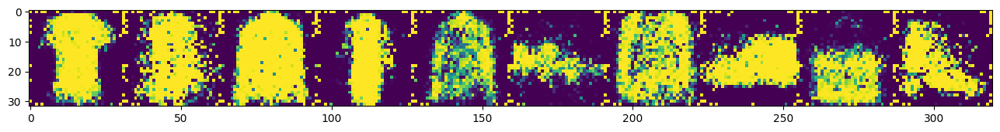

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 82/100] [D loss: 0.4106] [G loss: 3.0047]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 83/100] [D loss: 0.4313] [G loss: 2.9920]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 84/100] [D loss: 0.3935] [G loss: 3.0266]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 85/100] [D loss: 0.3703] [G loss: 3.1291]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 86/100] [D loss: 0.4620] [G loss: 2.8866]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 87/100] [D loss: 0.4823] [G loss: 2.8928]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 88/100] [D loss: 0.4443] [G loss: 2.9482]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 89/100] [D loss: 0.4471] [G loss: 2.9101]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 90/100] [D loss: 0.5146] [G loss: 2.8107]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 91/100] [D loss: 0.4904] [G loss: 2.7518]


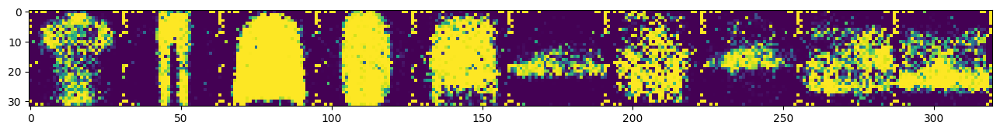

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 92/100] [D loss: 0.4780] [G loss: 2.8399]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 93/100] [D loss: 0.5952] [G loss: 2.4685]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 94/100] [D loss: 0.5227] [G loss: 2.6652]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 95/100] [D loss: 0.5308] [G loss: 2.5797]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 96/100] [D loss: 0.5852] [G loss: 2.5912]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 97/100] [D loss: 0.5529] [G loss: 2.6905]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 98/100] [D loss: 0.5692] [G loss: 2.4168]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 99/100] [D loss: 0.5944] [G loss: 2.5155]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 100/100] [D loss: 0.6081] [G loss: 2.4922]
dictionary saved successfully to file


In [44]:
cgan = ModifiedCGANTrainer(z_dim=32, img_dim=C_IN*IMG_SIZE*IMG_SIZE, hidden_size=256, n_classes=10)
cgan_history = cgan.train(dataloader, latent_size=32, label_dim=10)

torch.save(cgan.cgenerator.state_dict(), './cgan_gen.pt')
torch.save(cgan.cdiscriminator.state_dict(), './cgan_disc.pt')

with open('cgan_hist.pkl', 'wb') as fp:
    pickle.dump(cgan_history, fp)
    print('dictionary saved successfully to file')

## DDPM (73 + 25 points)

Denoising diffusion probabilistic models (DDPMs) learn to generate images by gradually denoising a completely random pattern in a step-by-step process. The model learns a set of diffusion steps that describe how the noise evolves through time and a denoising function that removes the noise at each time step. The denoising function is typically implemented as a neural network that takes in the noisy data and the time step as input and outputs the denoised data. After iterative denoising steps over a time index, an image from the training distribution is generated. The overall procedure of training and sampling from DDPM is represented in the following pseudocodes from DDPM paper. For more details on the loss function and the sampling process, please refer to the course slides and the paper.

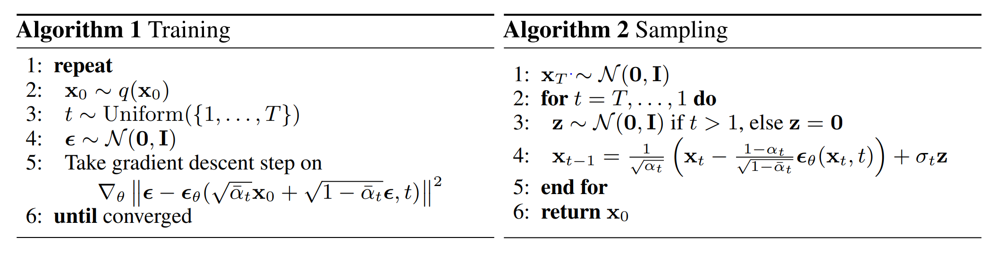

The pseudocode shows that the loss function is defined as an MSE on per time step noise and the predicted noise for the current time step. So we only need to train a model that learns to reverse the noise from an input image at a specific time step. In this notebook, we will use the architecture proposed by the paper, a UNet with image and time as the inputs and predicted noise as the output. They augment the regular UNet with several sub-modules and techniques such as ResNets, Attention modules, etc. We describe the expected architecture for this notebook:

+ *ResNet:* As a base sub-module, we define each ResNet block as two consecutive convolutional layers with a GELU activation in between and Group Normalization after each convolutional layer. You can use this module in Down/Up blocks. Also, by removing the residual connection, you can use this block as a convolutional network throughout the network.
+ *Attention:* This is also a sub-module consisting of a Layer Normalization, Multi-head Attention (use from `torch.nn`), a residual connection, a feed-forward network, and another residual connection.
+ *Conditional UNet:* Each Up/Down block in UNet accepts positionally-encoded time as an input. The time index is encoded and added to the output of the block. You can use the sinusoidal position embeddings proposed in [Attention is All You Need.](https://arxiv.org/pdf/1706.03762.pdf)

You can implement the following structure for UNet:

+ Convolutional block
+ Down block
+ Attention 
+ Down block
+ Attention
+ Down block
+ Attention

+ Convolutional block (bottleneck)
+ Convolutional block (bottleneck)
+ Convolutional block (bottleneck)

+ Up block
+ Attention
+ Up block
+ Attention
+ Up block
+ Attention
+ Convolutional block

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchtext.nn import PositionalEncoding

def sinusoidal(time_index, hidden_dim, no_channels):
    batch_size = time_index.size(0)
    position_encoding = PositionalEncoding(hidden_dim, dropout=0.0)
    time_index = time_index.unsqueeze(1)  # (batch_size, 1, 1)
    position_encoding = position_encoding(time_index)  # (batch_size, 1, hidden_dim)
    return position_encoding.view(-1, hidden_dim, 1, 1).repeat(1, 1, no_channels, no_channels)


class ConvResNet(nn.Module):
    def __init__(self, in_channels, out_channels, residual):
        super(ConvResNet, self).__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1), 
            nn.GroupNorm(32, out_channels), 
            nn.GELU(), 
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1), 
            nn.GroupNorm(32, out_channels)
        )
        slef.residual = residual

    def forward(self, x):
        res = x
        x = self.layers(x)
        if self.residual: return F.gelu(x + residual)
        else : return x

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()

        self.layers = nn.Sequential(
            ConvResNet(in_channels, out_channels, residual = True), 
            ConvResNet(in_channels, out_channels), 
        )

        self.pool = nn.MaxPool2d(2)
        

    def forward(self, x, t):
      x = self.layers(x + sinusoidal(t, x.size(1), x.size(2)))
      return x, self.pool(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Up, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.layers = nn.Sequential(
            ConvResNet(in_channels, out_channels, residual = True), 
            ConvResNet(in_channels, out_channels)
        )

    def forward(self, x, skip, t):
        x = self.up(x)
        x = x + sinusoidal(t, x.size(1), x.size(2))
        x = torch.cat((x, skip), dim=1)
        x = self.layers(x)
        return x

class Attention(nn.Module):
    def __init__(self, in_channels, num_heads):
        super(Attention, self).__init__()
        self.layer_norm = nn.LayerNorm(in_channels)
        self.multi_head_attention = nn.MultiheadAttention(in_channels, num_heads, batch_first=True)
        self.feed_forward = nn.Sequential(
            nn.LayerNorm(in_channels),
            nn.Linear(in_channels, in_channels),
            nn.GELU(),
            nn.Linear(in_channels, in_channels)
        )

    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multi_head_attention(x, x, x)
        x = x + self.feed_forward(x + attn_output)
        return x

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels, num_heads=8):
        super(UNet, self).__init__()
        self.down1 = Down(in_channels, 64)
        self.attn1 = Attention(64, num_heads)
        self.down2 = Down(64, 128)
        self.attn2 = Attention(128, num_heads)
        self.down3 = Down(128, 256)
        self.attn3 = Attention(256, num_heads)

        self.bottleneck = nn.Sequential(
            ConvResNet(256, 256),
            ConvResNet(256, 256),
            ConvResNet(256, 256)
        )

        self.up1 = Up(256 + 256, 128)
        self.attn4 = Attention(128, num_heads)
        self.up2 = Up(128 + 128, 64)
        self.attn5 = Attention(64, num_heads)
        self.up3 = Up(64 + 64, 32)
        self.attn6 = Attention(32, num_heads)

        self.conv_out = ConvResNet(32, out_channels)

    def forward(self, x, t):
        t = t.unsqueeze(2).unsqueeze(3)
        skip1 , out = self.down1(x, t)
        out = self.attn1(out)
        
        skip2, out = self.down2(out, t)
        out = self.attn2(out)

        skip3, out = self.down3(out, t)
        out = self.attn3(out)

        bottleneck = self.bottleneck(out)

        out = self.attn4(self.up1(out, skip3, t))

        out = self.attn5(self.up2(out, skip2, t))

        out = self.attn6(self.up3(out, skip1, t))

        out = self.conv_out(out)
        return out


In [ ]:
##########################################################
# TODO (40 points): 
# Complete each class based on the previous explanations.
##########################################################

class ConvResNet(nn.Module):
    def __init__(self, *args, **kwargs):
        super(ConvResNet, self).__init__()

    def forward(self, x):
        pass

class Down(nn.Module):
    def __init__(self, *args, **kwargs):
        super(Down, self).__init__()

    def forward(self, x, t):
        pass


class Up(nn.Module):
    def __init__(self, *args, **kwargs):
        super(Up, self).__init__()

    def forward(self, x, skip, t):
        pass


class Attention(nn.Module):
    def __init__(self, *args, **kwargs):
        super(Attention, self).__init__()

    def forward(self, x):
        pass


class UNet(nn.Module):
    def __init__(self, *args, **kwargs):
        super(UNet, self).__init__()

    def forward(self, x, t):
        pass


In [ ]:
class DDPMManager():
    def __init__(self):

        self.T = 1000
        self.beta_start = 1e-4 # \beta_t is the sqrt(\sigma_t) from the pseudocode.
        self.beta_end = 0.02

        ##########################################################
        # TODO (6 points): 
        # Instantiate the model and the optimizer. You can use Adam.
        # Define \alpha, \beta, and \bar{alpha} for all T time steps. 
        # Use cosine scheduling for \beta.
        ##########################################################

        self.unet = UNet().to(DEVICE)
        self.criterion = nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.unet.parameters(), lr=LR)


        t = np.linspace(0, self.T, self.T)
        self.betas = torch.tensor(-1 * np.cos(math.pi * t / (2 * self.T)) * (self.beta_end - self.beta_start) + self.beta_end, dtype=torch.float32, device=DEVICE)
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.cumprod(self.alphas, dim=0)

    def train(self, dataloader):

        history = dict(loss=[])
        for epoch in range(EPOCHS):
            total_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)

                ##########################################################
                # TODO (15 points): 
                # Sample a time step `t` and create noisy images for the  
                # `t`th step of the diffusion according to \bar{alpha} 
                # values. Then predict the noise using self.unet.
                # Compute the loss and backpropagate.
                ##########################################################

                t_samples = torch.randint(0, self.T, [batch_x.shape[0]], device=DEVICE)
                alpha_bars = self.alpha_bars[t_samples]
                sqrt_alpha_bars = torch.sqrt(alpha_bars).unsqueeze(-1).unsqueeze(-1).unsqueeze(-1)
                sqrt_1_minus_alpha_bars = torch.sqrt(1 - alpha_bars).unsqueeze(-1).unsqueeze(-1).unsqueeze(-1)
                epsilons = torch.randn(batch_x.shape, device=DEVICE)

                noisy_imgs = sqrt_alpha_bars * batch_x + sqrt_1_minus_alpha_bars * epsilons
                epsilon_hat = self.unet(noisy_imgs, t_samples.unsqueeze(-1).unsqueeze(-1).unsqueeze(-1).type(torch.float))

                loss = self.criterion(epsilon_hat.reshape(-1, self.in_size), epsilons.reshape(-1, self.in_size))
                 
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                total_loss.append(loss.item())

            mean_loss = np.mean(total_loss)
            print(
                "[Epoch: %d/%d] [loss: %.4f]"
                % (epoch+1, EPOCHS, mean_loss)
            )

            if epoch % 5 == 0: 
                self.sample(8, plot=True)

            history['loss'].append(mean_loss)

        return history
    
    def sample(self, n, plot=True):

        ##########################################################
        # TODO (8 points): 
        # Generate a random pattern `x`. 
        # Then denoise `x` for self.T time steps.
        # Choose `n` images from the generated images during self.T 
        # time steps (`xs`).
        # The purpose is to show how denoising converts the pure 
        # noise to an image after self.T time steps.
        ##########################################################
        x = torch.randn(1, 1, 32, 32, device=DEVICE)
        epsilons = torch.zeros(1, 1, 32, 32, device=DEVICE)

        xs = []
        for t in reversed(range(self.T)):
            if t % 150 == 0 or t == 0 or t == (self.T - 1):
                xs.append(x.clone().cpu().reshape(1, 1, 32, 32))

            alpha = self.alphas[t]
            alpha_bar = self.alpha_bars[t]
            beta = self.betas[t]

            epsilon_hat = self.unet(x, t * torch.ones(1, device=DEVICE))

            x = (x - (1 - alpha) * epsilon_hat / math.sqrt(1 - alpha_bar)) / math.sqrt(alpha)
            epsilons = math.sqrt(beta) * torch.randn(1, 1, 32, 32, device=DEVICE)

            if t == 0:
                epsilons = torch.zeros(1, 1, 32, 32, device=DEVICE)

            x += epsilons

        xs = torch.cat(xs, dim=0)
        xs = xs.reshape(n, 1, 32, 32)

        with torch.no_grad():
            x = None
            xs = None
            if plot:
                plot_images(xs)
            return x

In [ ]:
ddpm = DDPMManager() # You can pass your arguments to the call.
ddpm_history = ddpm.train(dataloader)

### ❓ **Question 4**
> + ** *(4 points)* How can we generate images from a specific target class in DDPM? **

 - Denoising Diffusion Probabilistic Models (DDPM) generate images by simulating a diffusion process in reverse. To generate images from a specific target class, you can condition the DDPM on class information during the training process. This can be done by modifying the architecture of the model to accept class information as input and incorporating this information into the noise schedule.

 Here's a high-level outline of how we can condition a DDPM on class information:

  1. Modify the architecture: Update the architecture of the DDPM to accept class information as input. You can do this by concatenating the one-hot encoded class label with the input image or by using class embeddings.

  2. Condition the noise schedule: Incorporate the class information into the noise schedule. This can be done by conditioning the noise schedule on the class label or by using a separate noise schedule for each class.

  3. Train the model: Train the DDPM using the modified architecture and noise schedule. During training, provide the class information along with the input images.

  4. Generate images: To generate images from a specific target class, provide the class information during the sampling process. The DDPM will generate images conditioned on the given class information.




> ** *(Bonus - 25 points)* Implement your idea and plot one trajectory of denoised images per class.**

## Comparisons (10 points)

History of each training has been stored in `[MODEL]_history`. Plot the losses for each model. Also sample images from each model and compare your results. 

### VAE:

In [ ]:
import matplotlib.pyplot as plt
import math

for i in range(10):
  _ = vae.sample(8,32)

X1 = range(1,len(vae_history['loss'])+1)
Y1 = vae_history['loss']

plt.plot(X1, Y1)
plt.set_title("VAE")
plt.show()

### GAN:


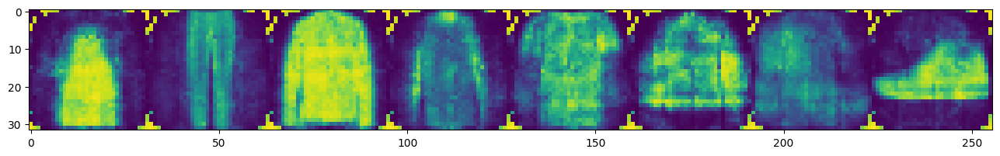

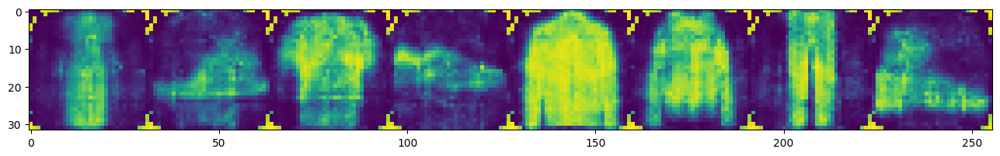

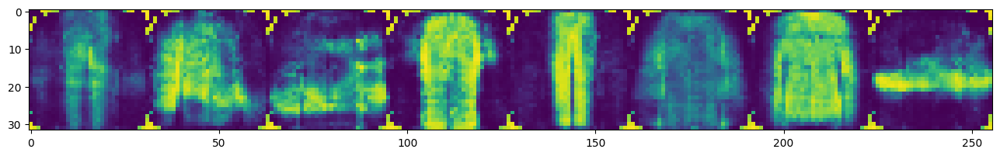

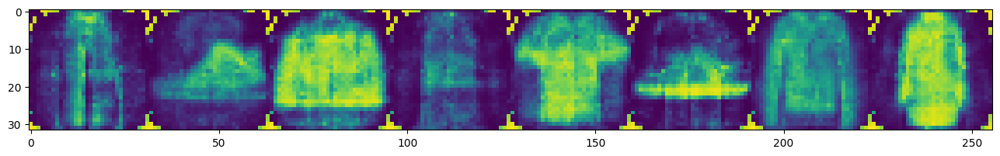

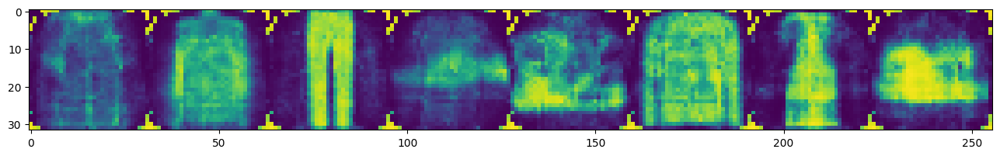

...

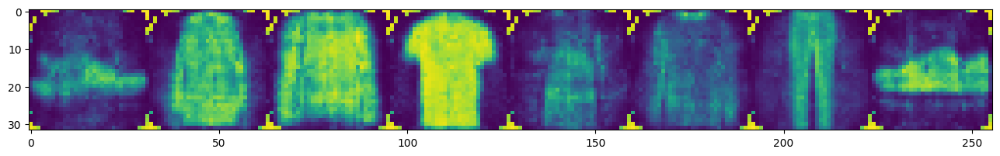

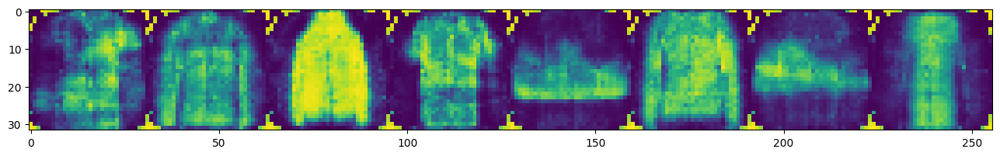

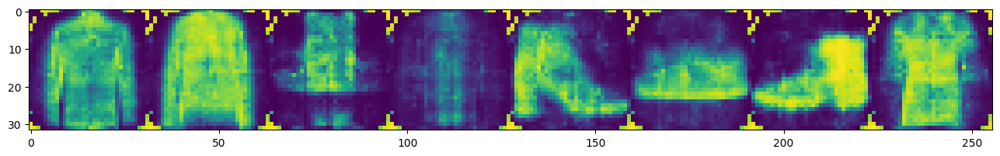

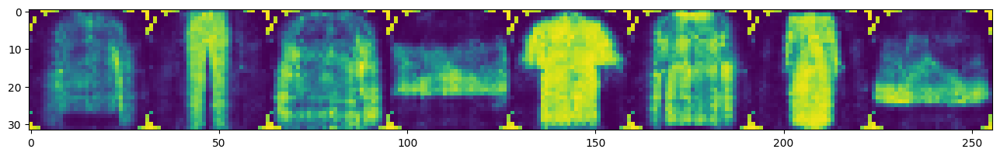

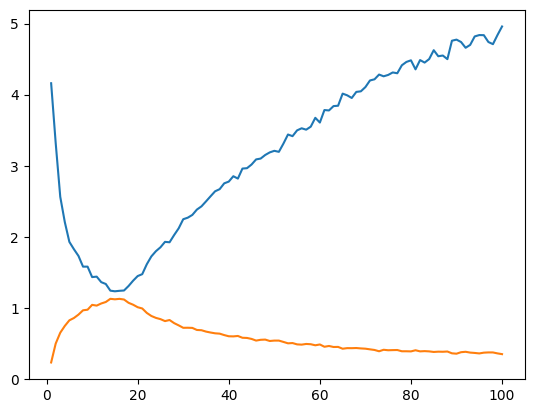

In [20]:
for i in range(10):
  _ = gan.sample(8,32)

X2 = range(1,len(gan_history['g_loss'])+1)
Y2 = gan_history['g_loss']  

X22 = range(1,len(gan_history['d_loss'])+1)
Y22 = gan_history['d_loss']

plt.plot(X2, Y2)
plt.plot(X22, Y22)
plt.show()

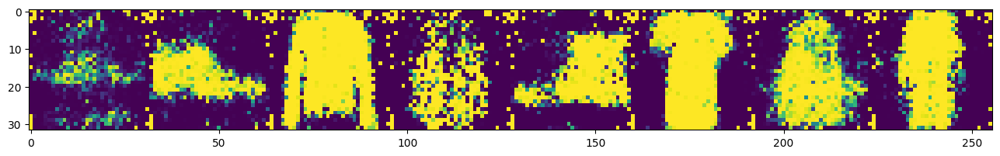

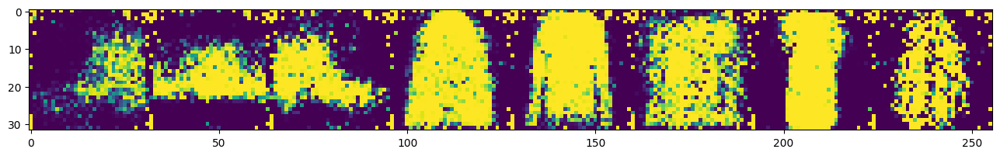

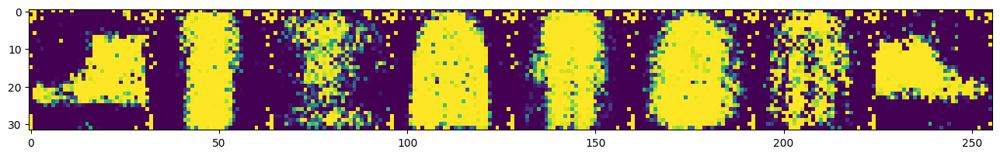

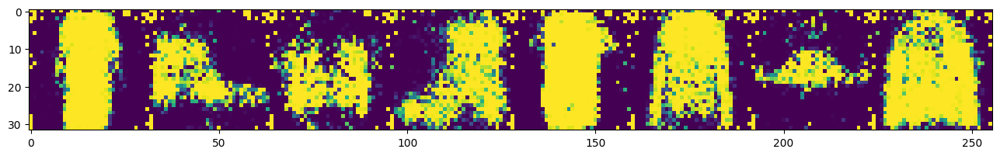

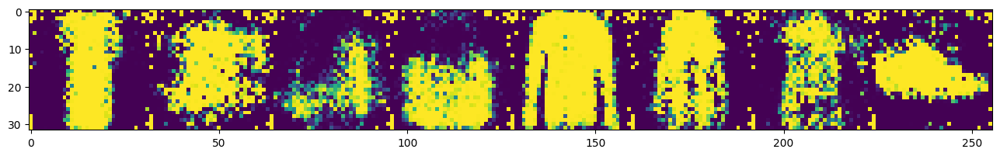

...

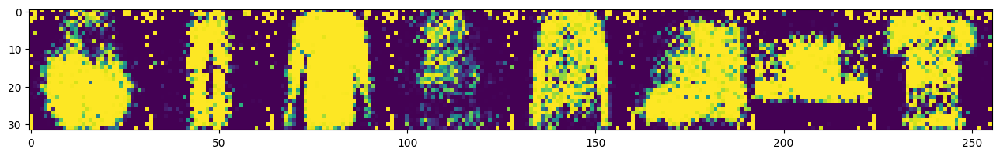

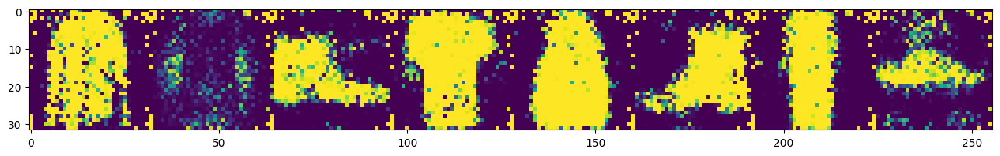

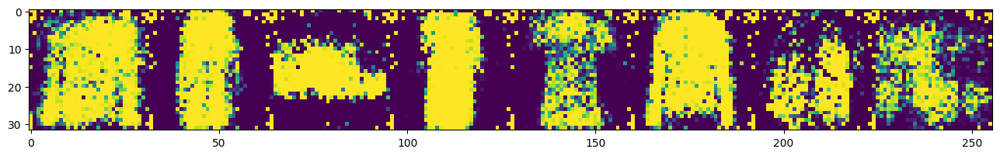

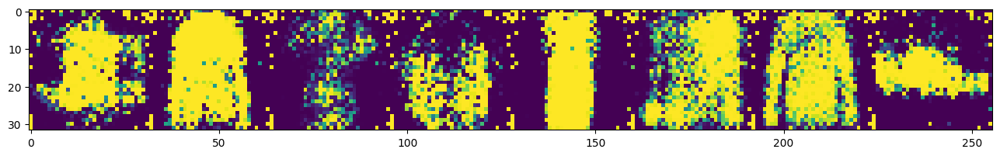

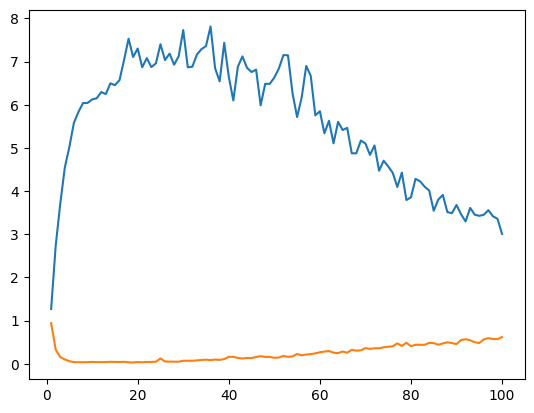

In [26]:
for i in range(10):
  _ = gan1.sample(8,32)

X2 = range(1,len(gan_history1['g_loss'])+1)
Y2 = gan_history1['g_loss']  

X22 = range(1,len(gan_history1['d_loss'])+1)
Y22 = gan_history1['d_loss']

plt.plot(X2, Y2)
plt.plot(X22, Y22)
plt.show()

### CGAN:

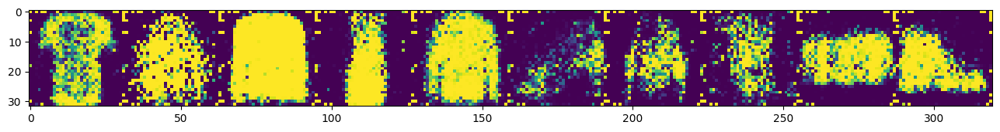

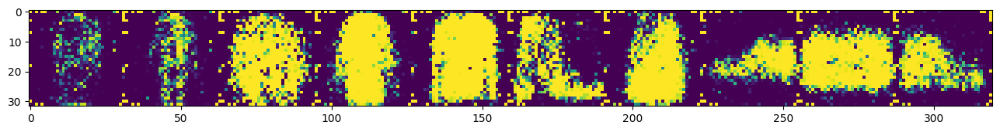

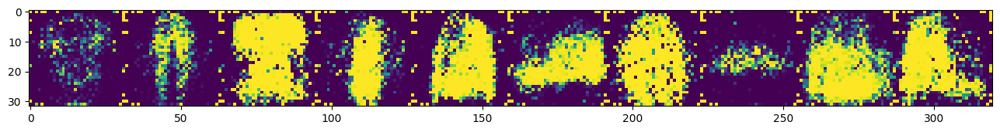

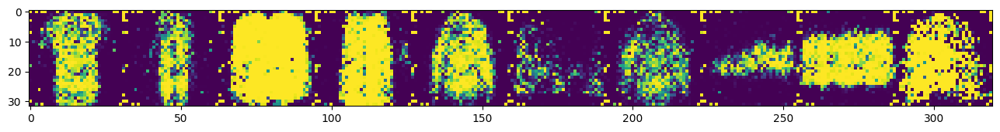

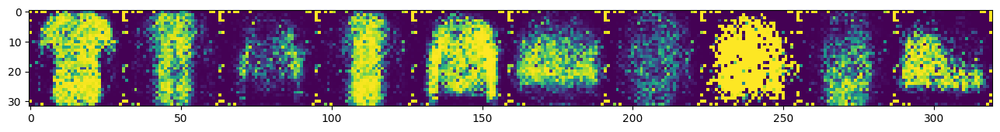

...

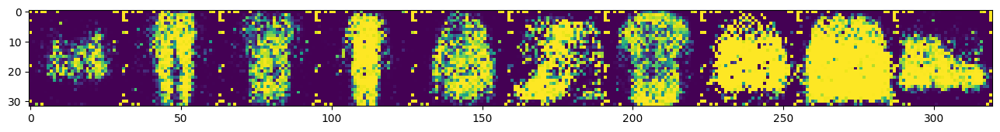

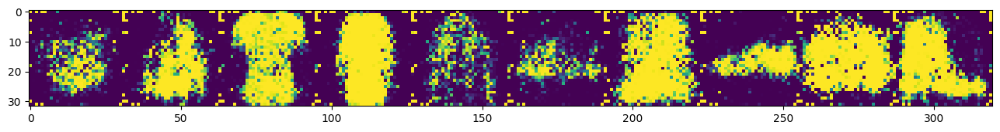

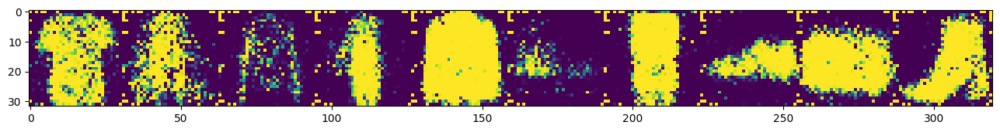

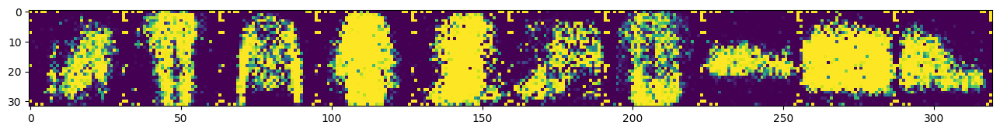

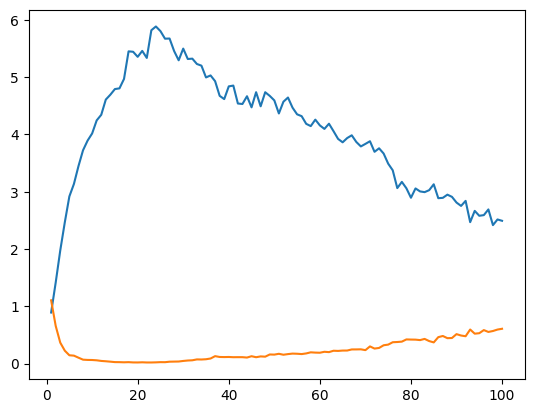

In [49]:
for i in range(10):
  _ = cgan.sample(10, 32, plot=True)

X3 = range(1,len(cgan_history['g_loss'])+1)
Y3 = cgan_history['g_loss']  


X33 = range(1,len(cgan_history['d_loss'])+1)
Y33 = cgan_history['d_loss']

plt.plot(X3, Y3)
plt.plot(X33, Y33)
plt.show()

### DDPM:

In [ ]:
for i in range(10):
  _ = ddpm.sample(8, 32, plot=True)


X4 = range(1,len(ddpm_history['loss'])+1)
Y4 = ddpm_history['loss'] 

plt.plot(X4, Y4)
plt.set_title("DDPM")
plt.show()